# Домашняя работа №4

### Выполнил: Бутенко Александр, БПМИ131

Импортируем все необходимые модули

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')

### Часть 0

Дан датасет рукописных чисел. Строки - развернутые в векторы матрицы пикселей рисунков чисел. Изображения имеют разрешение 28 на 28 пикселей, поэтому векторы имеют размер 784. Итого 784 атрибута, каждый принимает значение от 0 до 255, показывающее интенсивность пикселя в черно-белом спектре. Чем больше значение - тем чернее пиксель. Всего 42000 таких векторов. Каждому такому вектору соответствует значение из столбца label, которое указывает, какое число изображено на картинке. Если свернуть вектор в матрицу 28x28, то можно посмотреть на любое число визуально. Строить графики распределений атрибутов кажется бессмысленной затеей, так как речь идет об интенсивности пикселей.

Поэтому сразу перейдем к методу главных компонент. Как известно, главные компоненты являются собственными числами выборочной ковариационной матрицы, поэтому напишем такой класс, который будет принимать на вход функции fit матрицу объект-признак, у которой каждый столбец отцентрирован на своей среднее. Оценим ковариационную матрицу, найдем ее собственные числа и собственные векторы, упорядочим их в порядке убывания собственных чисел. Из полученных векторов составим матрицу-проектор, которая будет проецировать исходное пространство на подпространство главных компонент. Класс будет хранить в своих полях все нужные нам показатели, такие как доля объясненной дисперсии, доля кумулятивной суммы объясненной дисперсии, трансформирующую матрицу и главные компоненты, упорядоченные по убыванию собственных чисел.

In [2]:
class PCA_h:
    def __init__(self, n_components):
        self.n_components_ = n_components

    def fit(self, X):
        self.n_ = X.shape[0]
        tmp_cov_mat = self.__cov_matrix(X)

        eig_vals, eig_vecs = np.linalg.eig(tmp_cov_mat)
        total_var = np.sum(eig_vals)
        var_explained = np.array(sorted(eig_vals, reverse=True))
        self.eig_vals = var_explained.copy()
        var_explained_cumulative = np.cumsum(var_explained)/total_var

        self.components_ = [comp for comp in eig_vecs[:, np.argsort(eig_vals)[::-1]].T]
        self.transforamtion_mat_ = np.array(self.components_).T
        self.var_explained_ = np.array(var_explained)/total_var
        self.var_explained_cum_ = var_explained_cumulative.copy()

    def transform(self, X, n_components):
        self.transforamtion_mat_ = np.array(self.components_[:n_components]).T
        return X @ self.transforamtion_mat_


    def __cov_matrix(self, X):
        cov_mat = X.T @ X / (self.n_ - 1)  # @ - синтаксический сахар для операции np.dot()
        return cov_mat
    
    def set_ncomponents(self, n_components):
        self.n_components_ = n_components
        return
    
    def get_ncomponents(self):
        return self.n_components_

Запишем полную выборку в переменную df и удалим столбец label

In [21]:
df = pd.read_csv('train.csv')
target = df['label'].copy()
del df['label']
df.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Построим первые 10 рисунков чтобы убедиться, что это действительно развернутые в векторы цифры

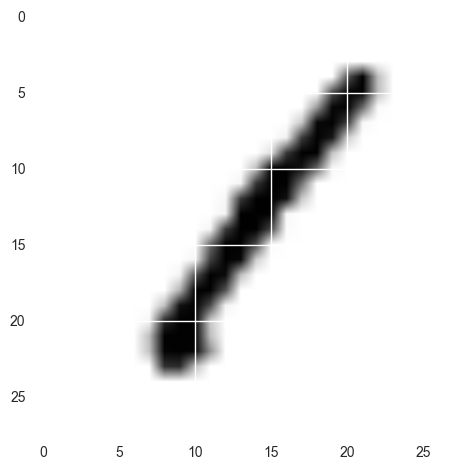

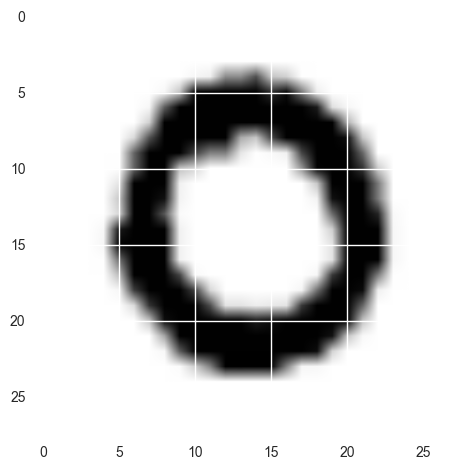

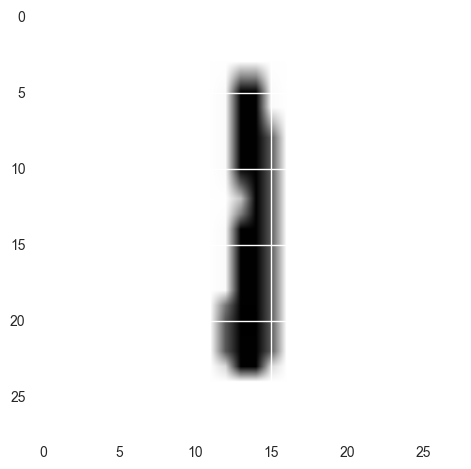

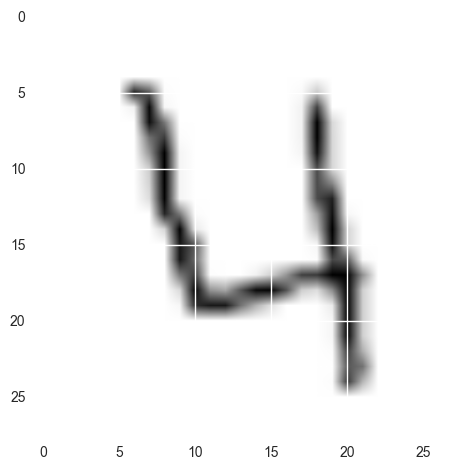

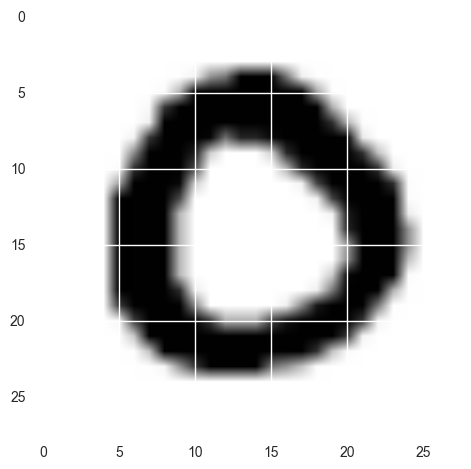

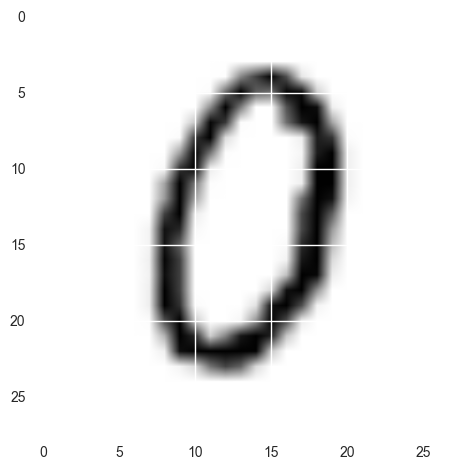

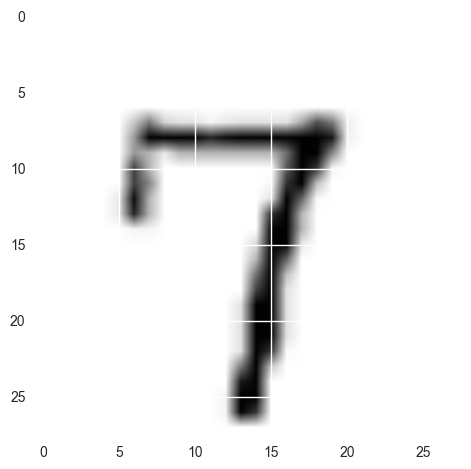

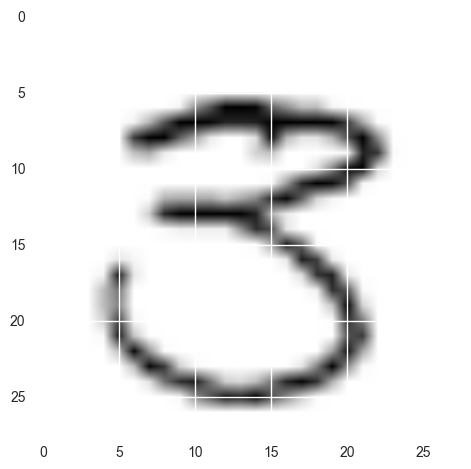

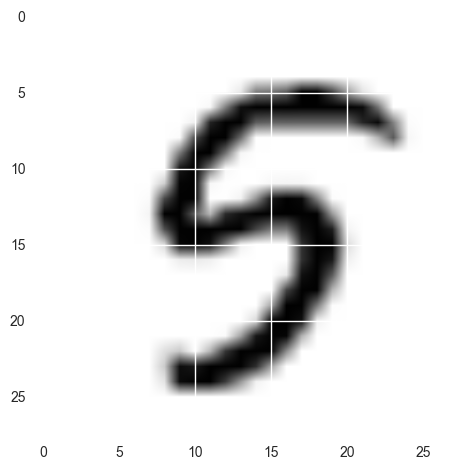

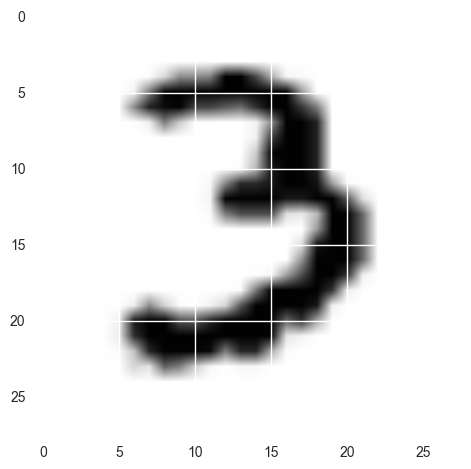

In [91]:
for image in df.values[:10]:
    plt.imshow(image.reshape((28, 28)))
    plt.show()

### Часть 1.1

Центрируем столбцы, создадим объект класса PCA_h и построим главные компоненты

In [4]:
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df)
df = scaler.transform(df)
my_pca = PCA_h(10)
my_pca.fit(df)
# my_pca.components_

Ниже выведены средние всех столбцов

In [5]:
pd.Series(scaler.mean_)

0      0.000000
1      0.000000
2      0.000000
3      0.000000
4      0.000000
5      0.000000
6      0.000000
7      0.000000
8      0.000000
9      0.000000
10     0.000000
11     0.000000
12     0.003000
13     0.011190
14     0.005143
15     0.000214
16     0.000000
17     0.000000
18     0.000000
19     0.000000
20     0.000000
21     0.000000
22     0.000000
23     0.000000
24     0.000000
25     0.000000
26     0.000000
27     0.000000
28     0.000000
29     0.000000
         ...   
754    0.000000
755    0.000000
756    0.000000
757    0.000000
758    0.000000
759    0.000000
760    0.000000
761    0.006143
762    0.035833
763    0.082357
764    0.114905
765    0.178714
766    0.301452
767    0.413643
768    0.513667
769    0.558833
770    0.677857
771    0.602810
772    0.489238
773    0.340214
774    0.219286
775    0.117095
776    0.059024
777    0.020190
778    0.017238
779    0.002857
780    0.000000
781    0.000000
782    0.000000
783    0.000000
dtype: float64

Среднее по всем пикселям всех рисунков

In [6]:
scaler.mean_.mean()

33.408911169825075

Первые 10 собственных чисел выборочной ковариационной матрицы для читаемости

In [10]:
my_pca.set_ncomponents(10)
pd.Series(list(map(lambda x: float(x), my_pca.eig_vals[:my_pca.get_ncomponents()])))

0    334780.591494
1    245885.065138
2    211051.626988
3    184726.373428
4    168070.001507
5    147773.282741
6    112534.619456
7     99315.437434
8     95016.014433
9     80660.730190
dtype: float64

Первые 10 собственных векторов

In [11]:
pd.DataFrame(np.array(my_pca.components_[:my_pca.get_ncomponents()]))

,0,1,2,3,4,5,6,7,8,9,...,774,775,776,777,778,779,780,781,782,783
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.000058,-0.000012,-0.000005,-0.000002,-0.000002,8.080378e-08,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000550,0.000279,0.000134,0.000037,0.000023,3.179050e-06,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000529,0.000284,0.000127,0.000037,0.000019,2.916217e-06,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.000253,-0.000158,-0.000094,-0.000044,-0.000051,-9.144558e-06,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.000580,-0.000306,-0.000168,-0.000066,-0.000093,-1.859124e-05,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000050,0.000022,-0.000018,-0.000020,-0.000030,-5.582169e-06,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.000224,-0.000118,-0.000042,-0.000021,-0.000025,-5.329529e-06,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.001139,0.000562,0.000238,0.000059,0.000032,3.559939e-06,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.000779,-0.000506,-0.000269,-0.000108,-0.000050,-8.334390e-06,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000127,-0.000077,-0.000038,-0.000037,-0.000030,-6.030213e-06,0.0,0.0,0.0,0.0


### Часть 1.2

Построим далее графики кумулятивной суммы доли объясненной дисперсии и график доли объясненной дисперсии.

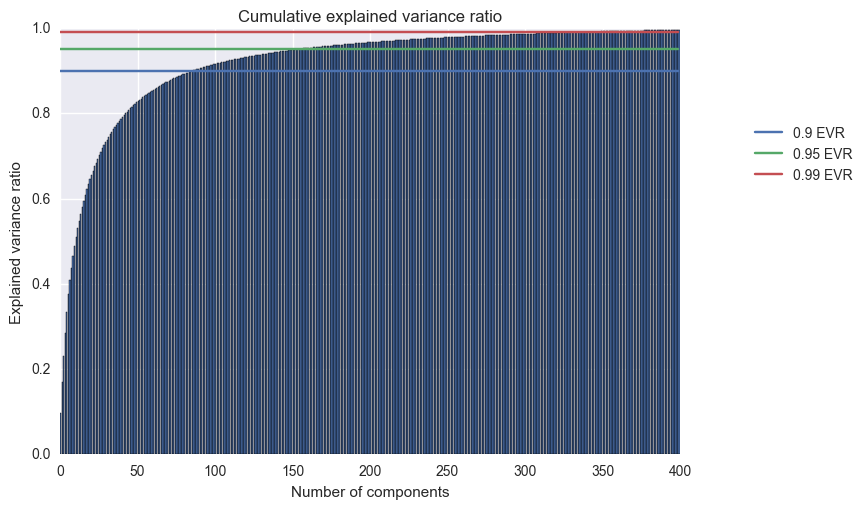

In [8]:
my_pca.set_ncomponents(400)
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio")
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()

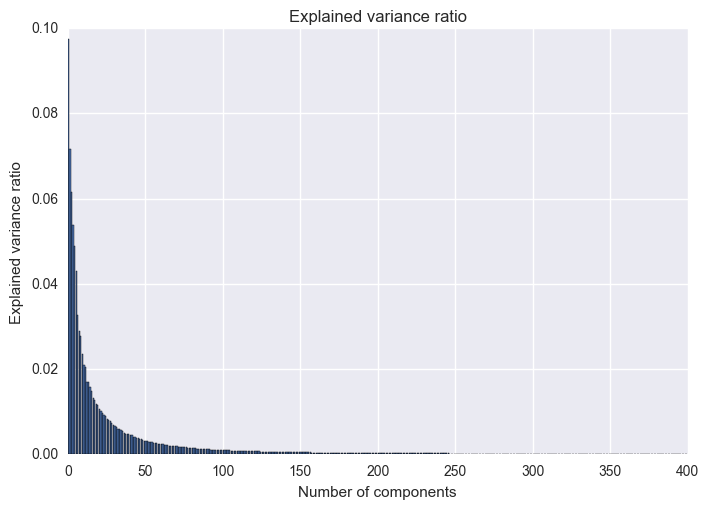

In [15]:
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio")
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()

На графиках можно увидеть, что примерно после добавления 250-ой компоненты доля добавляемой очередной компонентой объясненной дисперсии практически нулевая. То есть исходную размерность можно свести к 250 новым атрибутам.

### Часть 1.3

Нарисуем собственные векторы, отвечающие наибольшим собственным числам, как изображения чисел

Зададим линейное преобразование яркости пикселей

In [11]:
def transform_pixel(x):
    return x*3 + 100

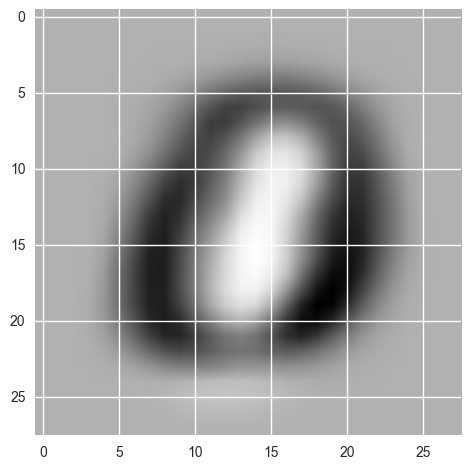

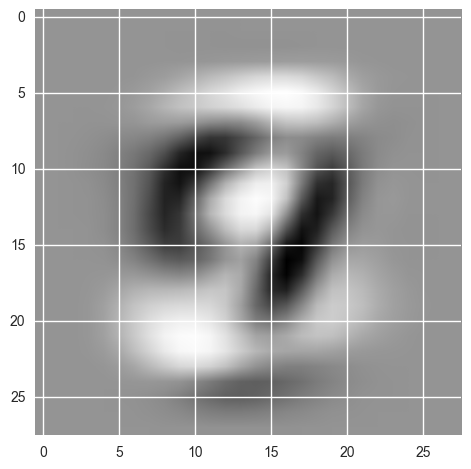

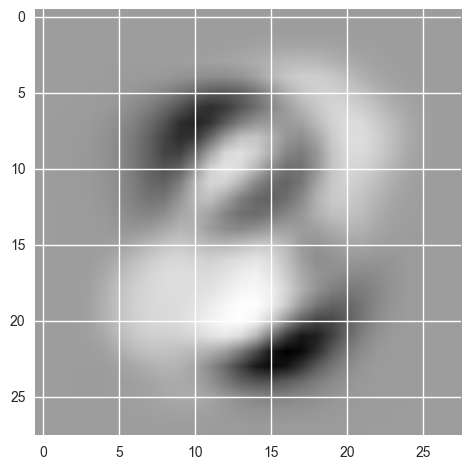

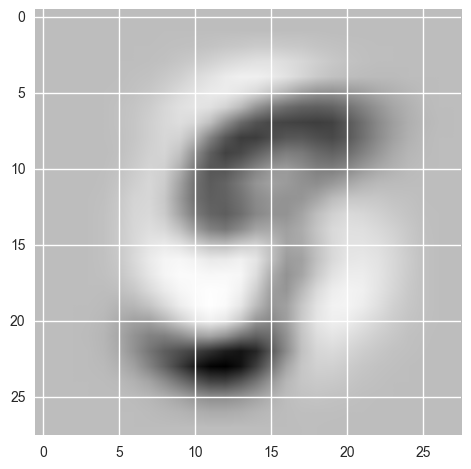

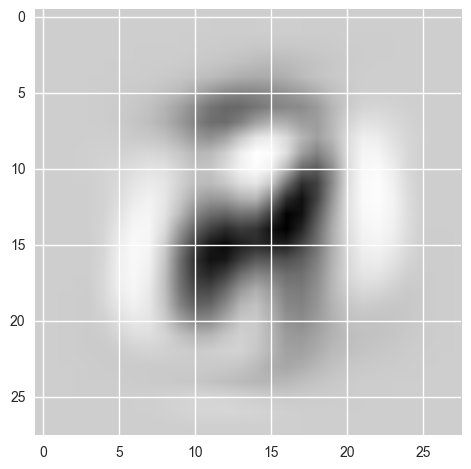

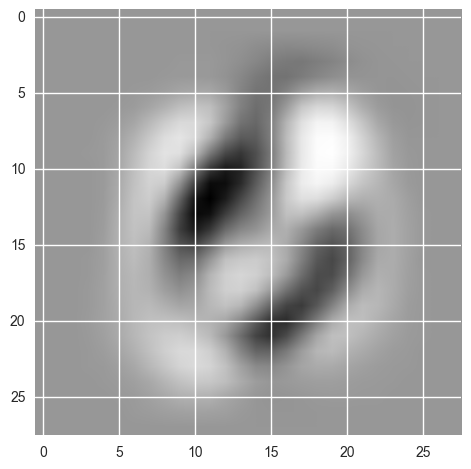

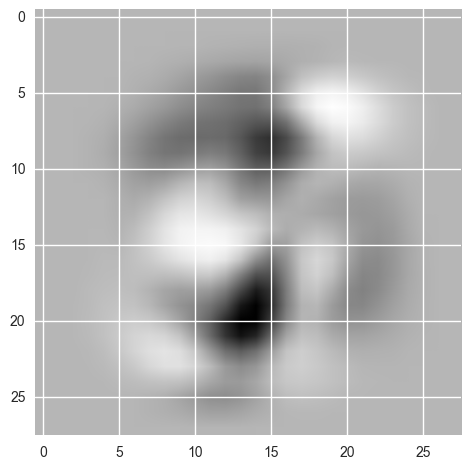

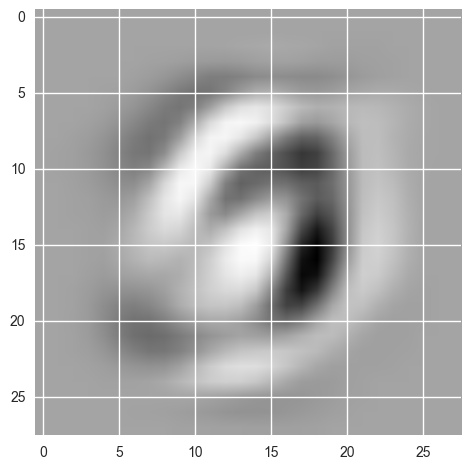

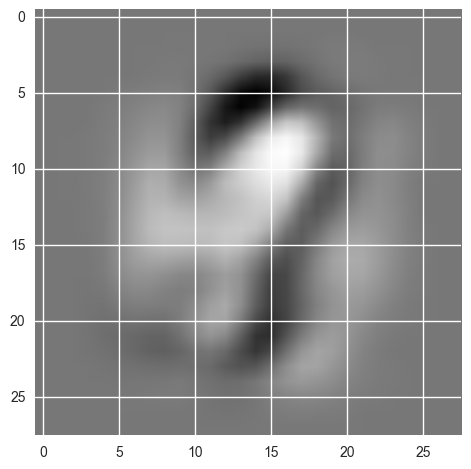

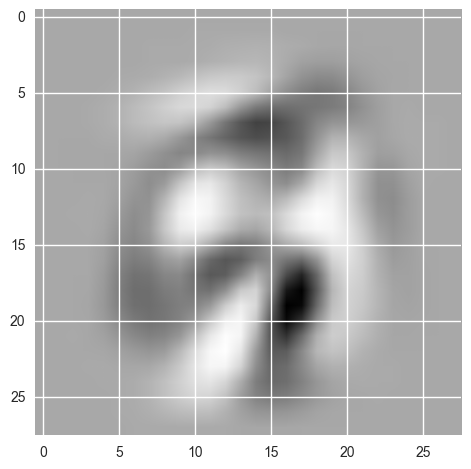

In [41]:
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, component))).reshape((28, 28)))
    plt.show()

### Часть 1.4

Нарисуем проекции исходных цифр на подпространство главных компонент

In [47]:
def find_components_num(variance, pca_obj):
    return (pca_obj.var_explained_cum_ <= 0.9).sum() - 1

In [85]:
comp_num = find_components_num(0.9, my_pca)
df_transformed = my_pca.transform(df, comp_num)

In [84]:
# for image in df_transformed[:10]:
#     im = list(map(lambda x: float(x), image))
#     plt.imshow((np.array(im)/np.sum(im)).reshape((10, 10)))
#     plt.show()

### Часть 2

Повторим действия для разных групп цифр

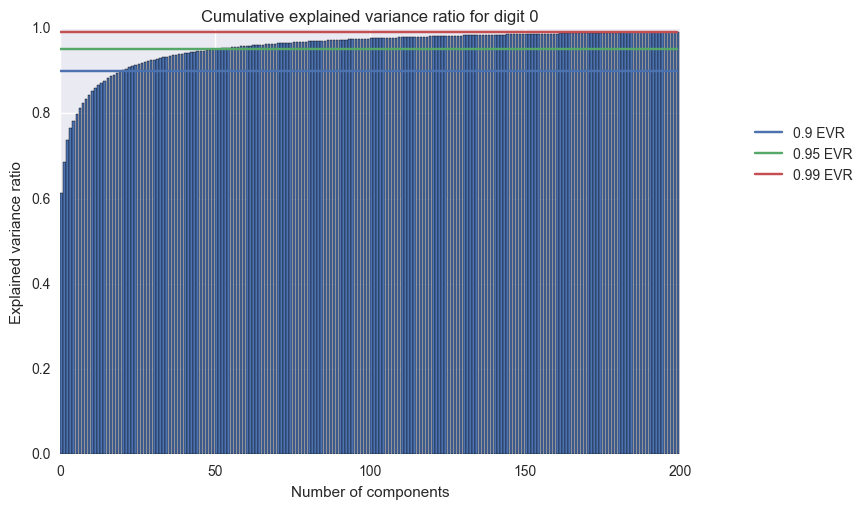

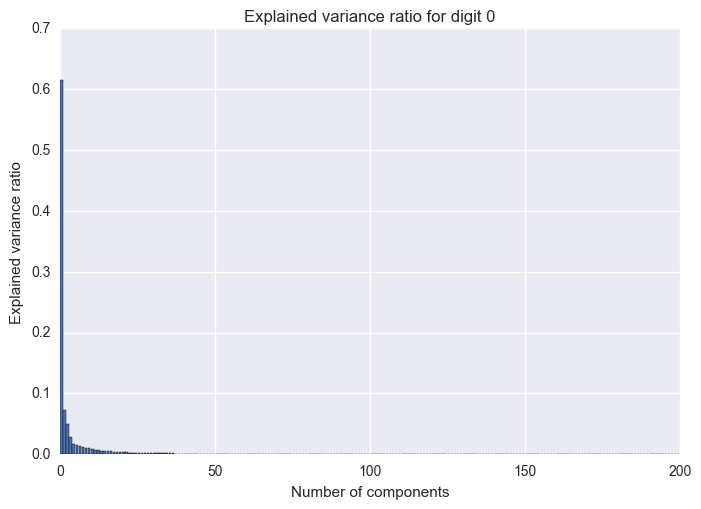

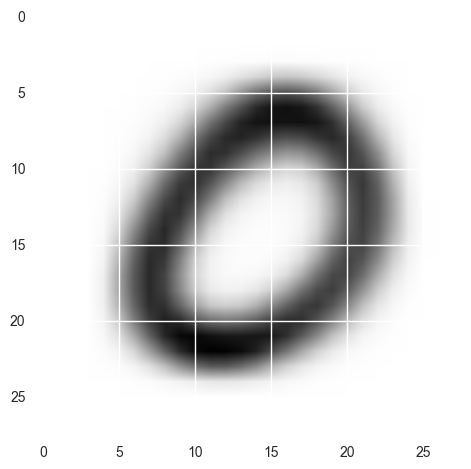

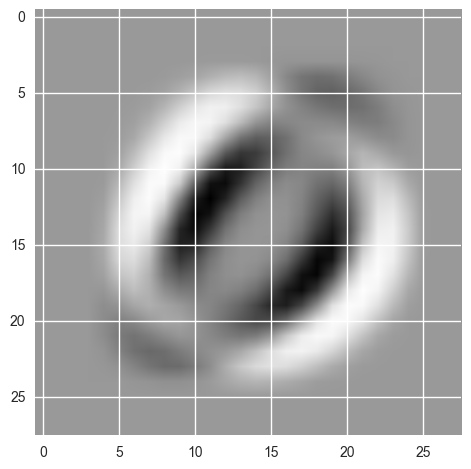

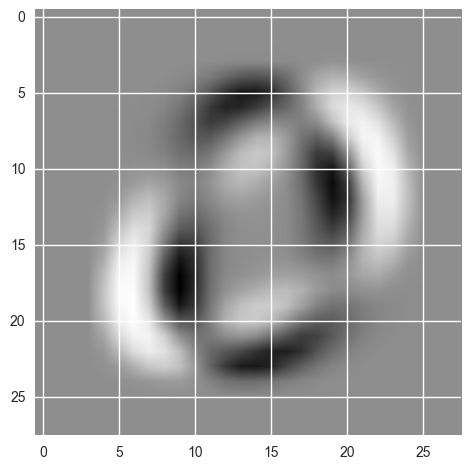

...

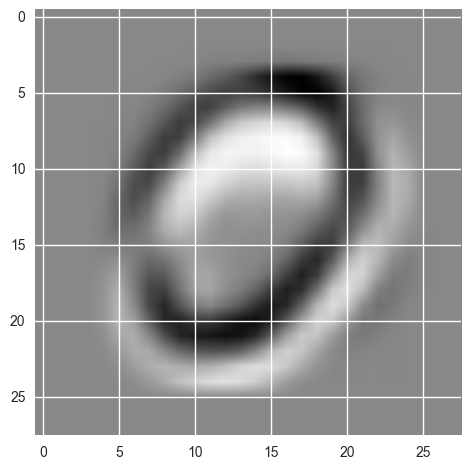

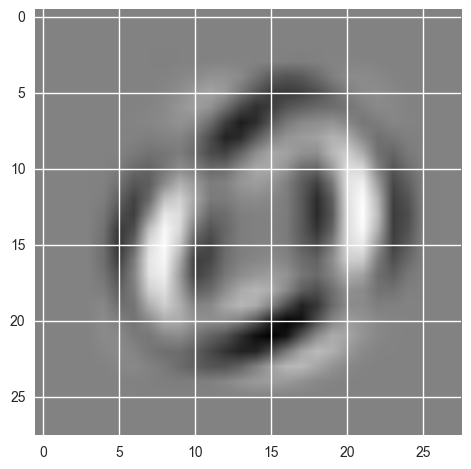

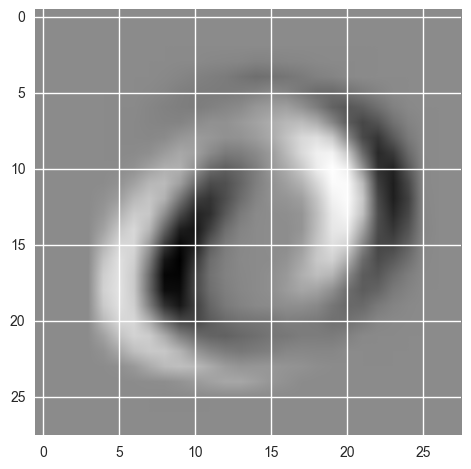

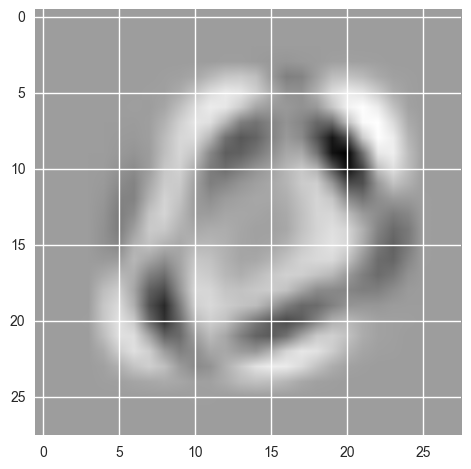

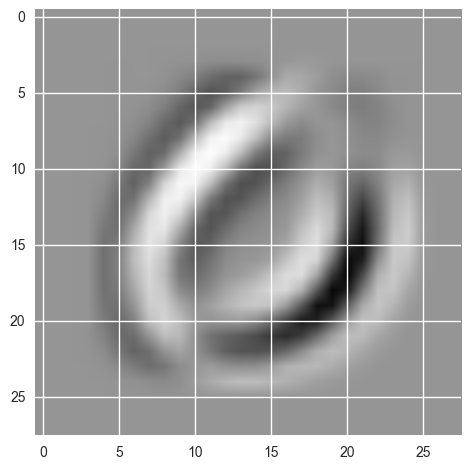

In [34]:
# target = target.values
digit = 0
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

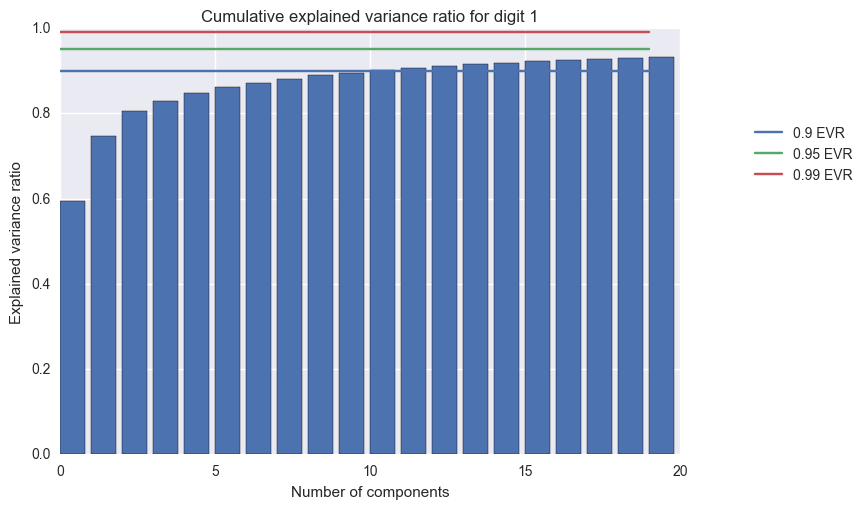

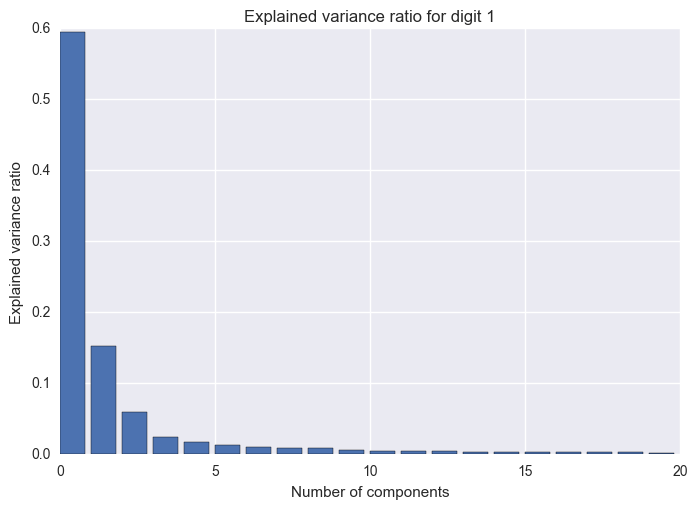

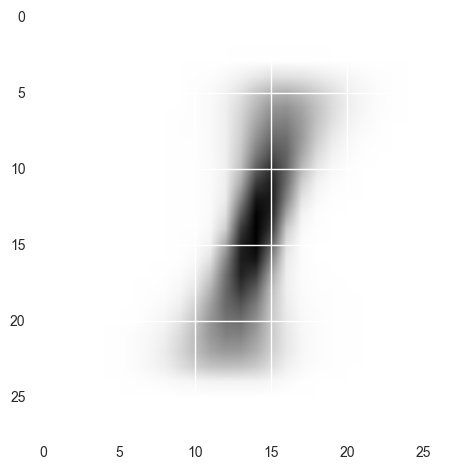

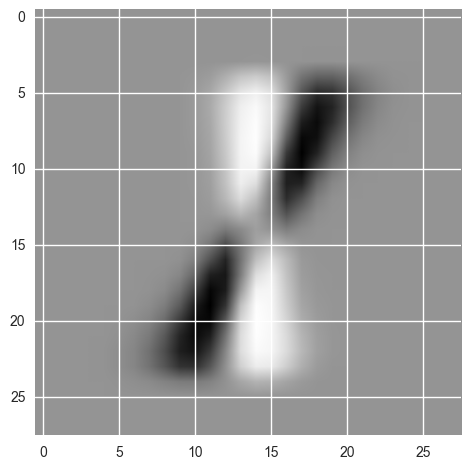

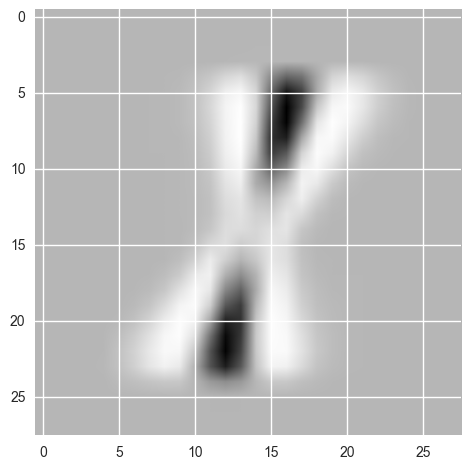

...

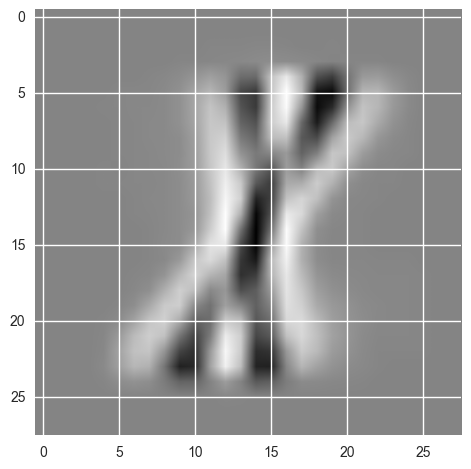

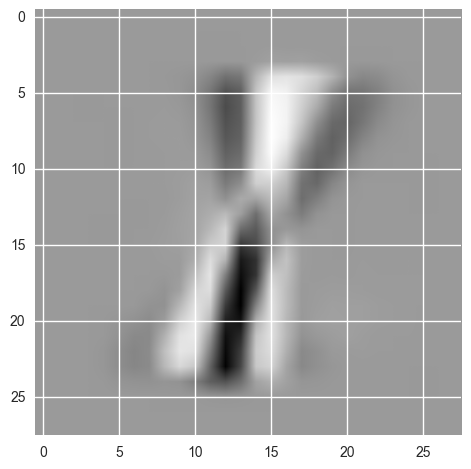

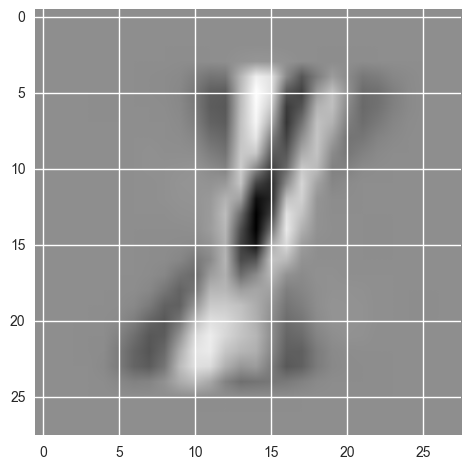

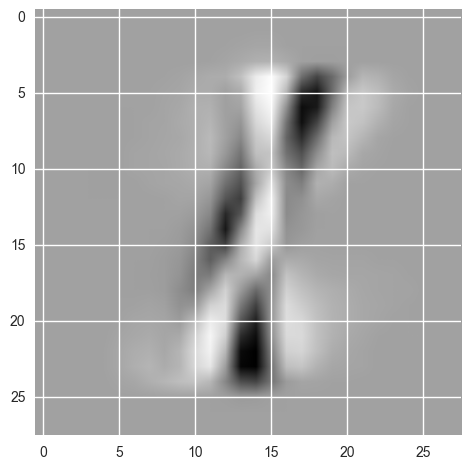

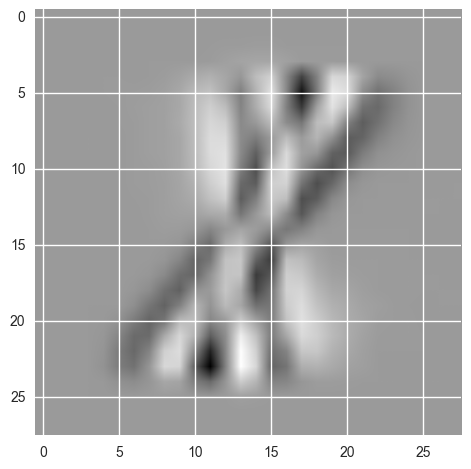

In [30]:
digit = 1
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(20)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

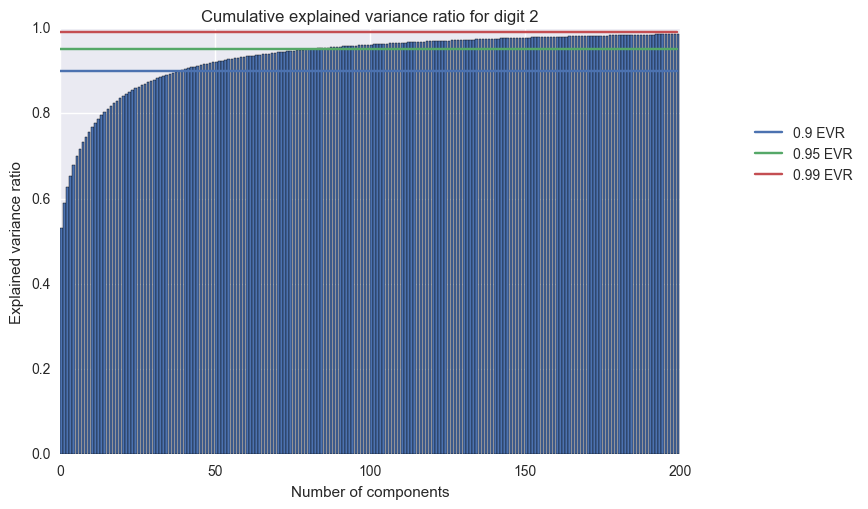

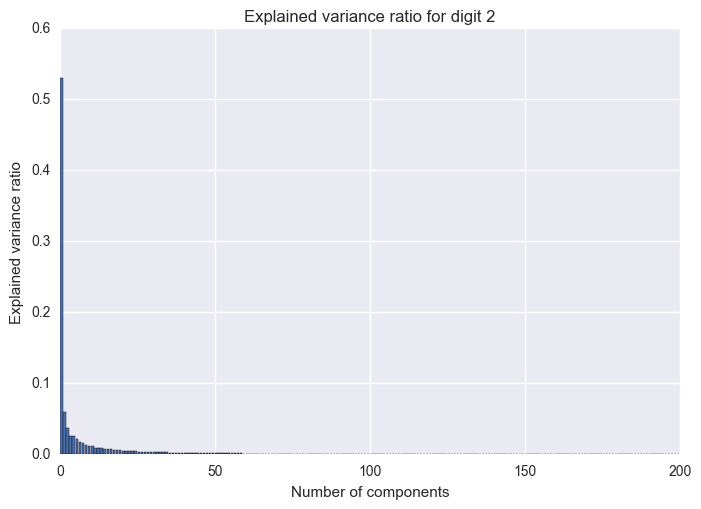

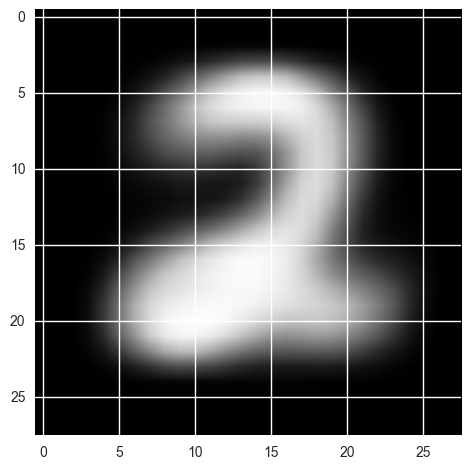

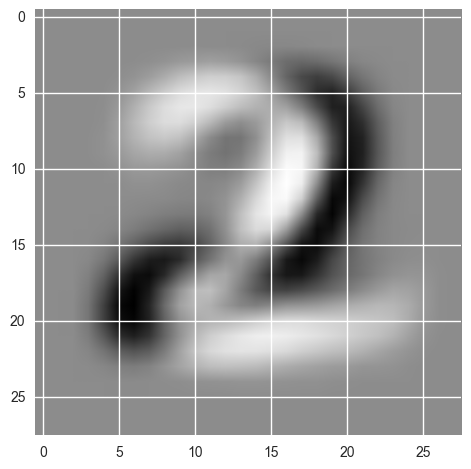

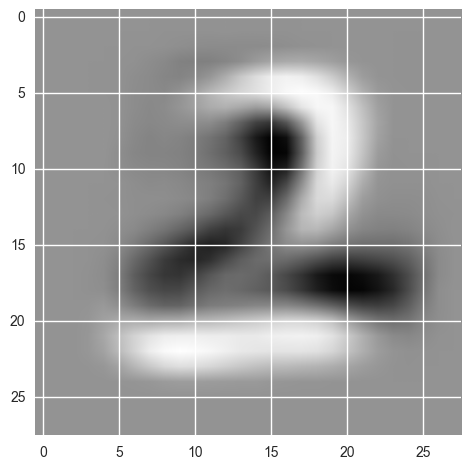

...

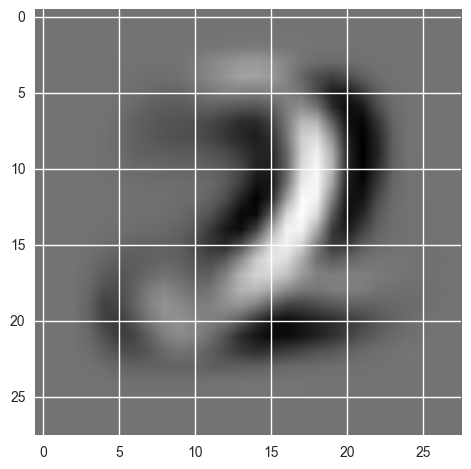

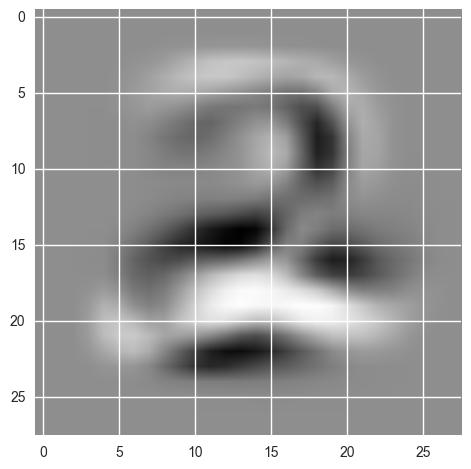

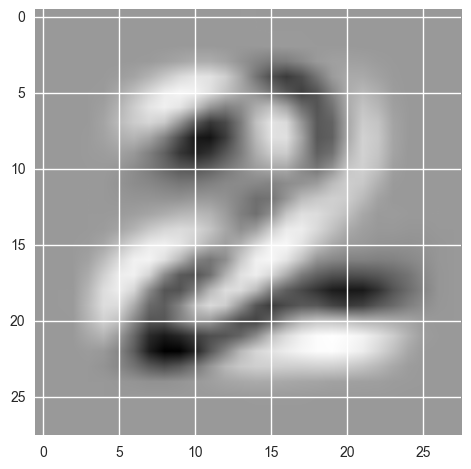

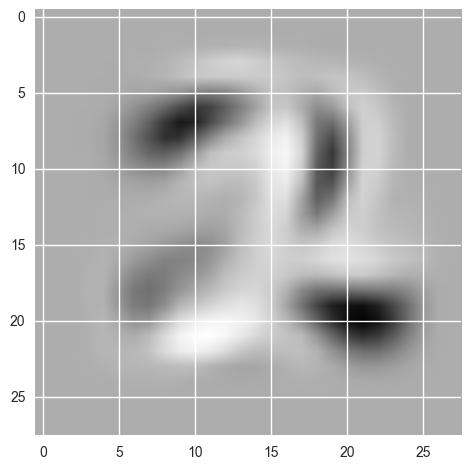

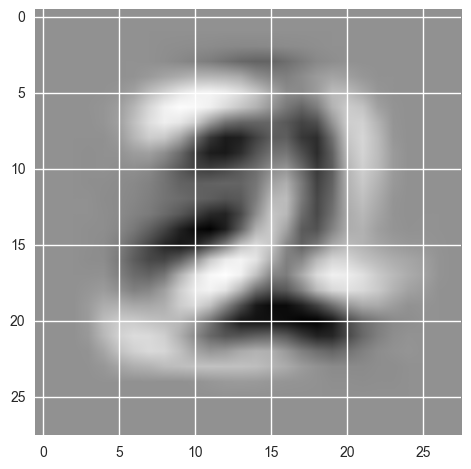

In [36]:
digit = 2
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

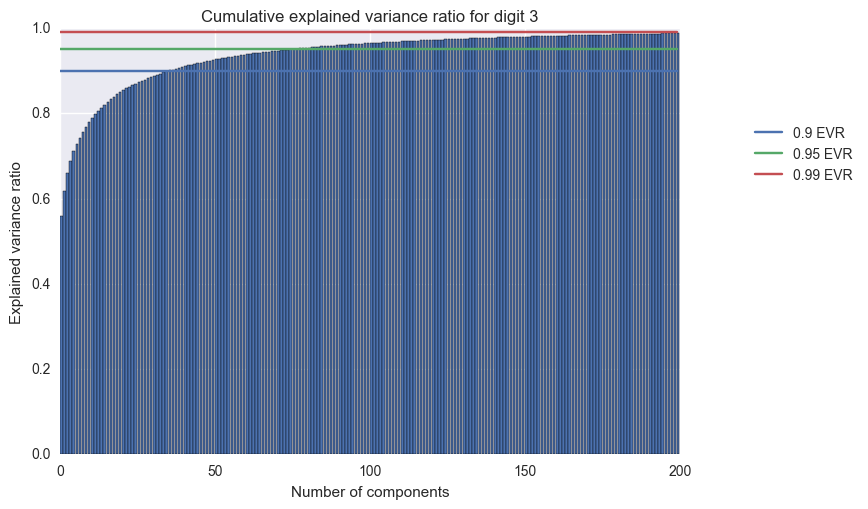

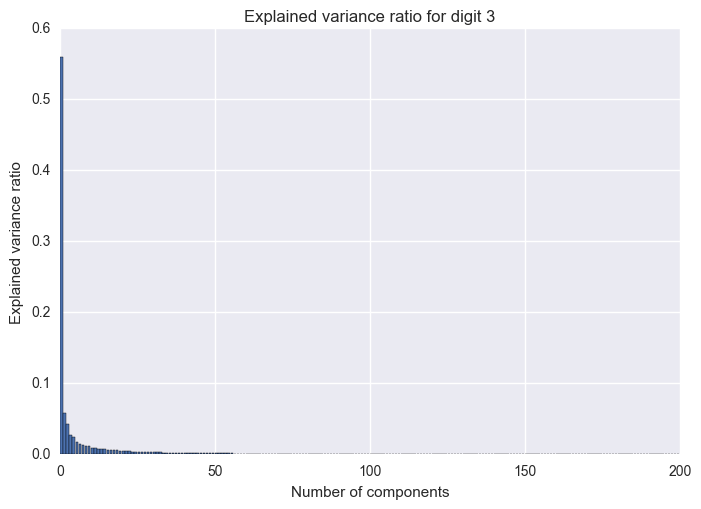

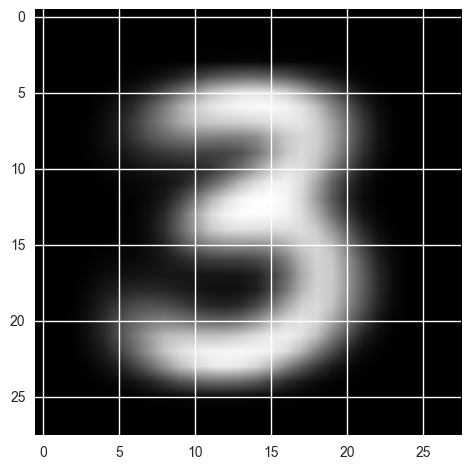

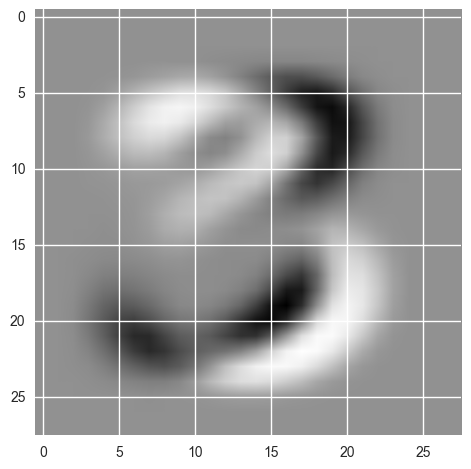

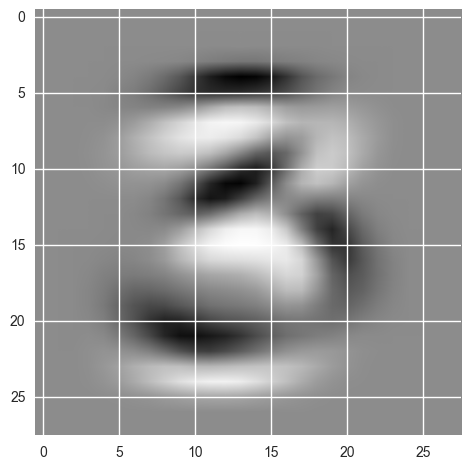

...

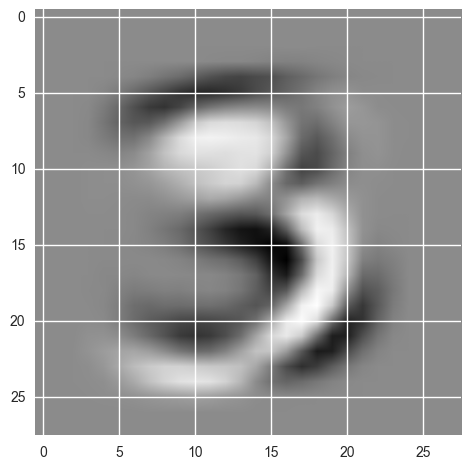

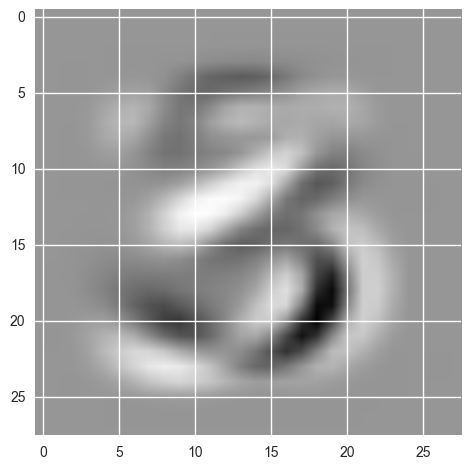

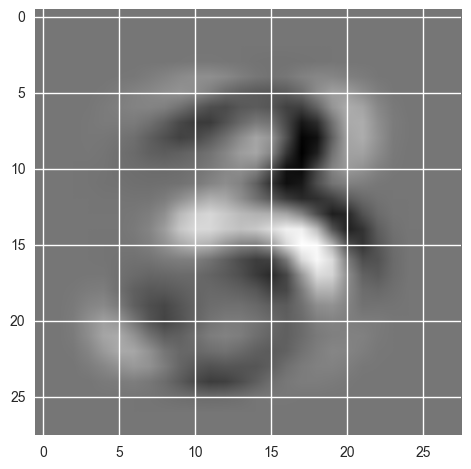

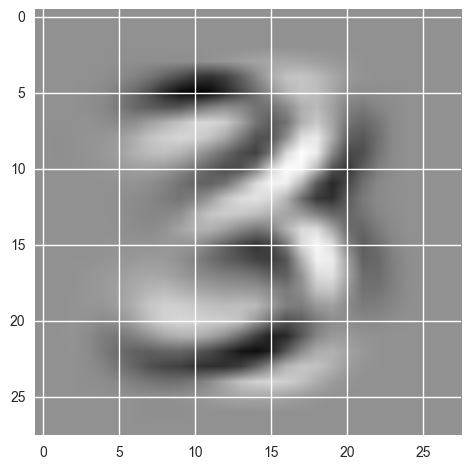

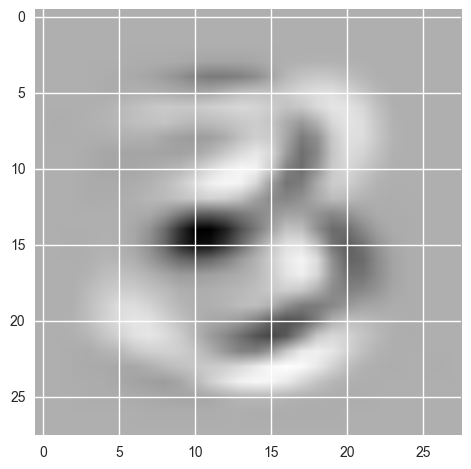

In [37]:
digit = 3
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

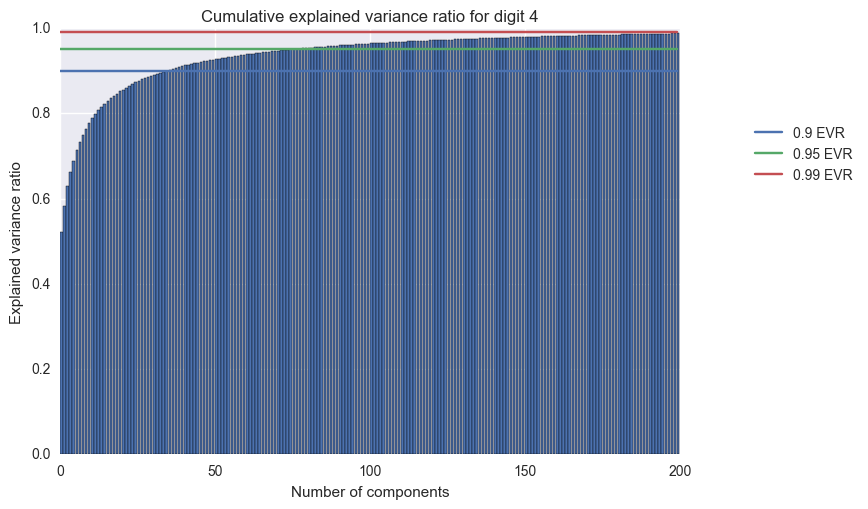

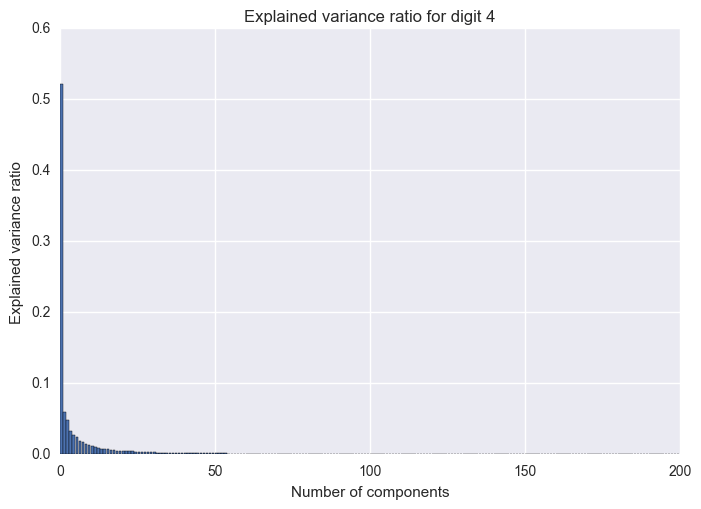

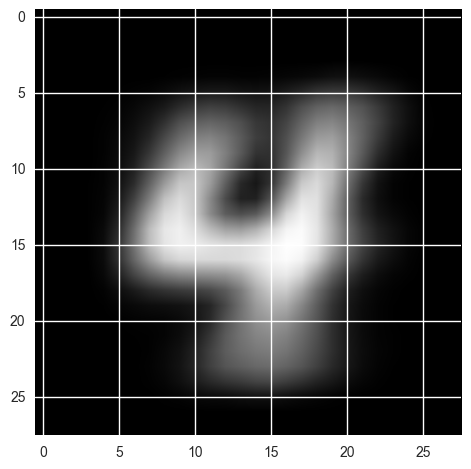

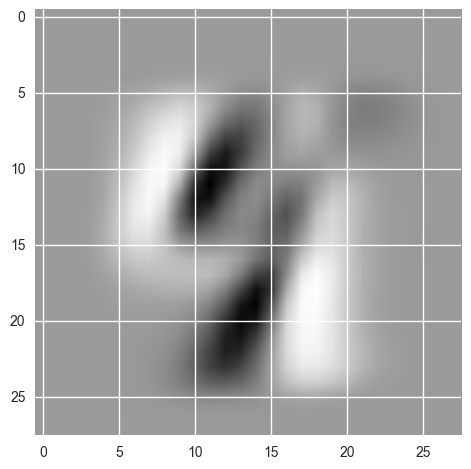

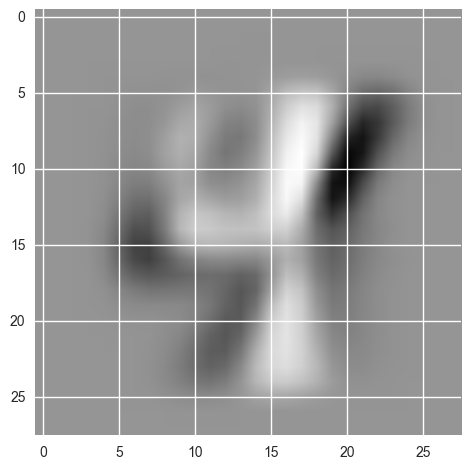

...

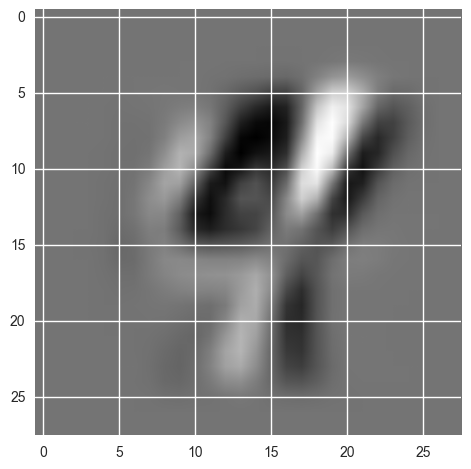

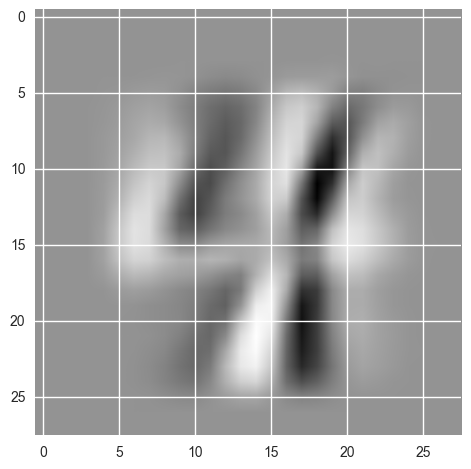

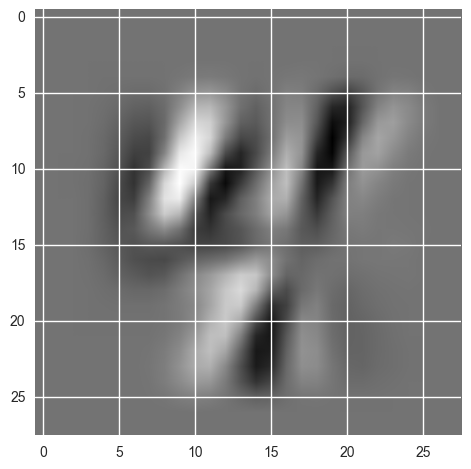

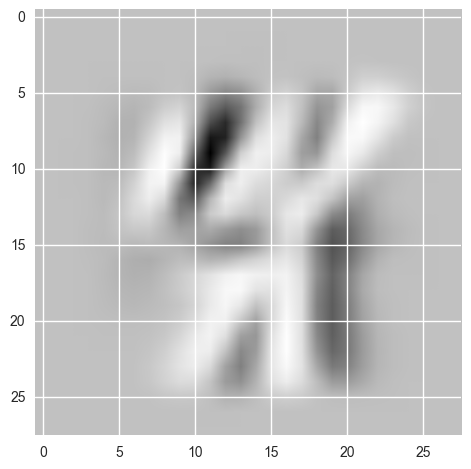

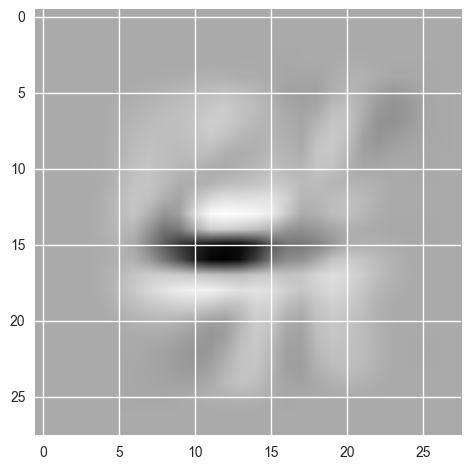

In [38]:
digit = 4
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

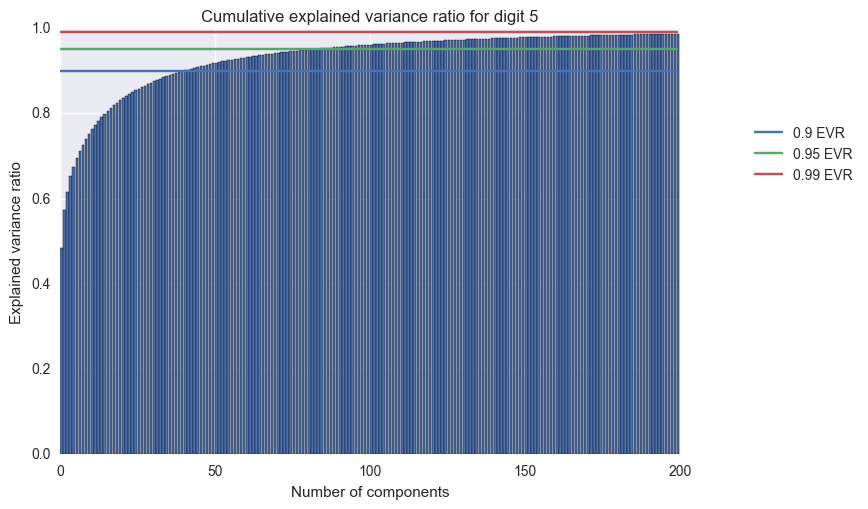

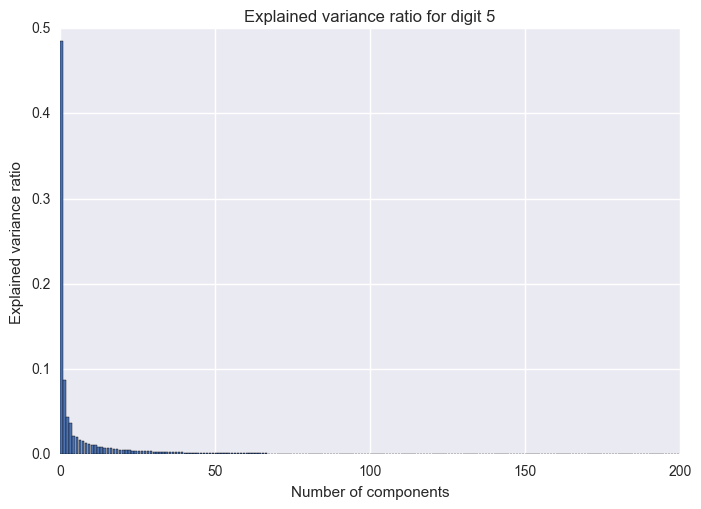

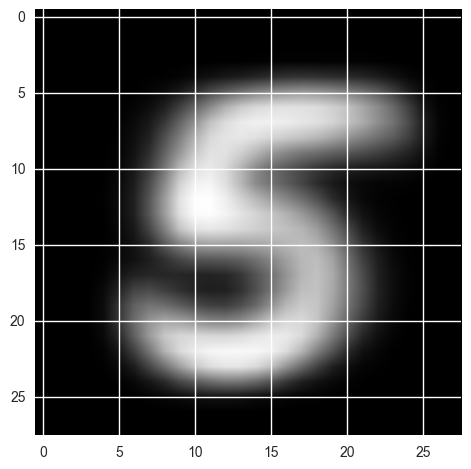

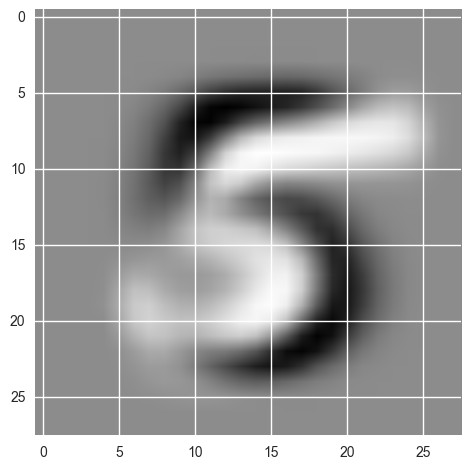

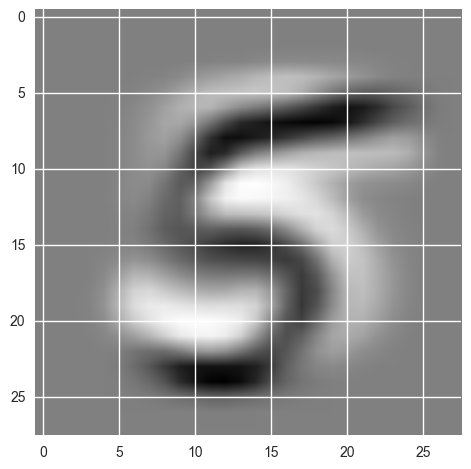

...

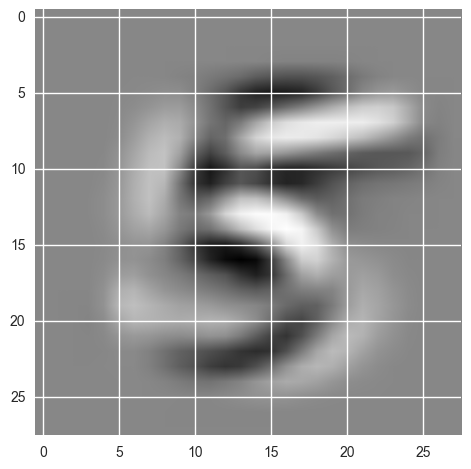

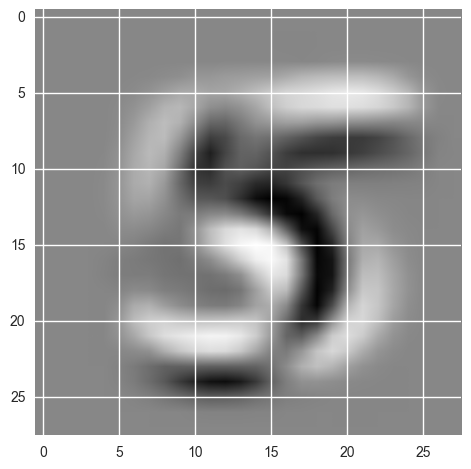

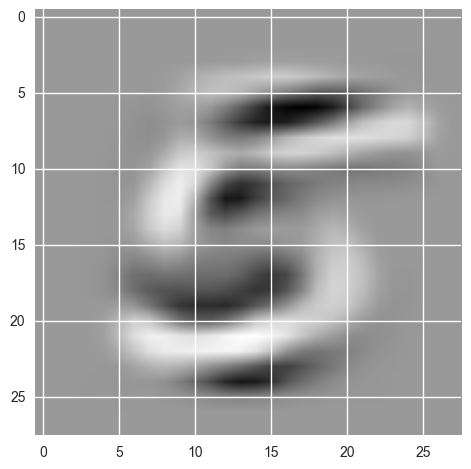

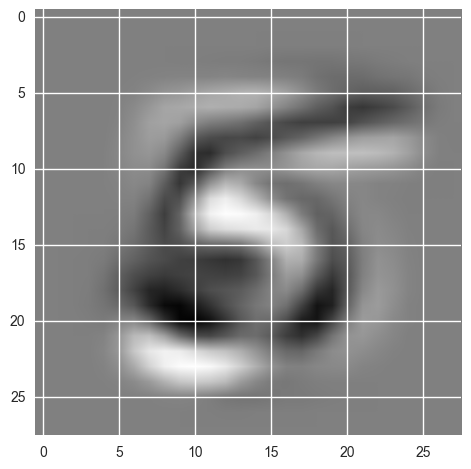

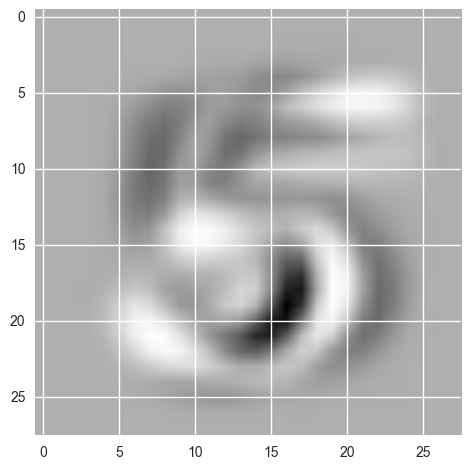

In [39]:
digit = 5
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

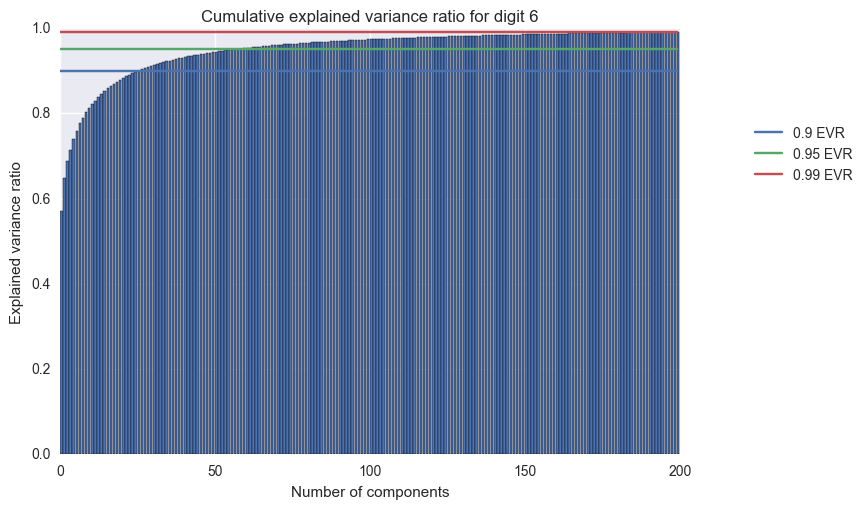

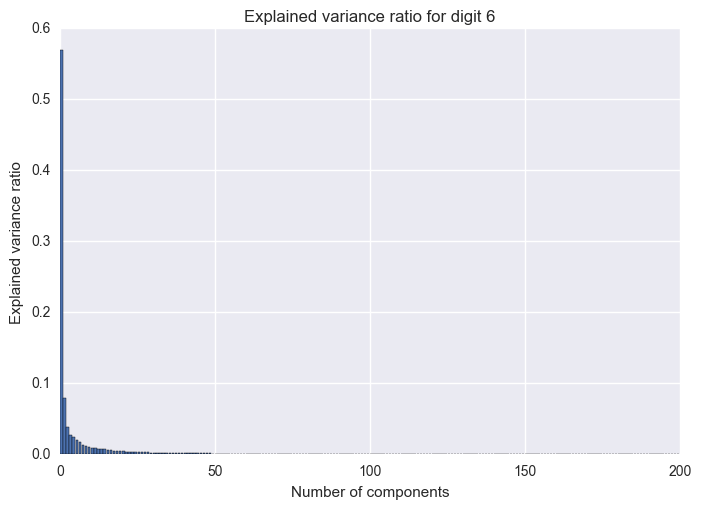

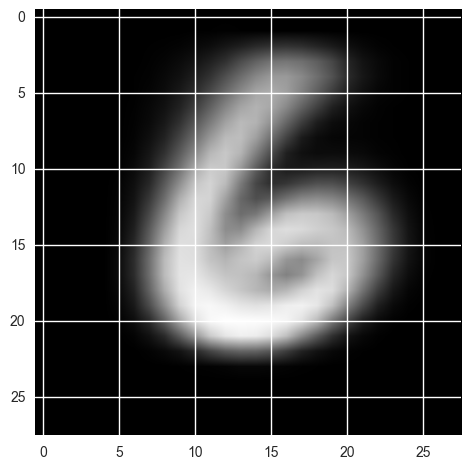

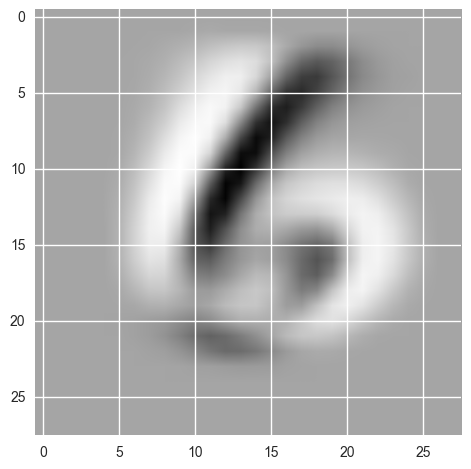

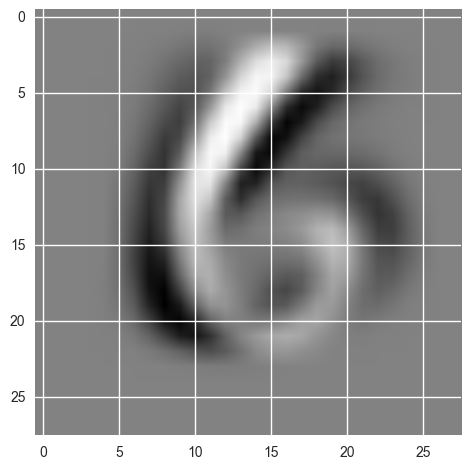

...

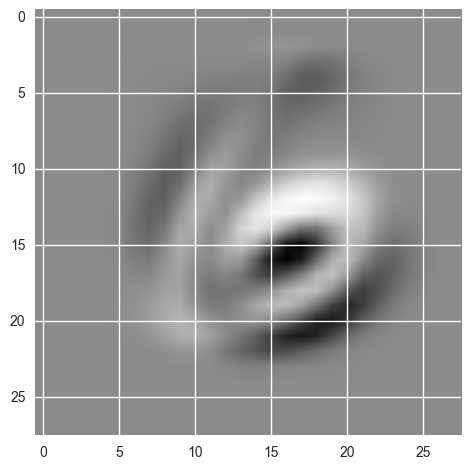

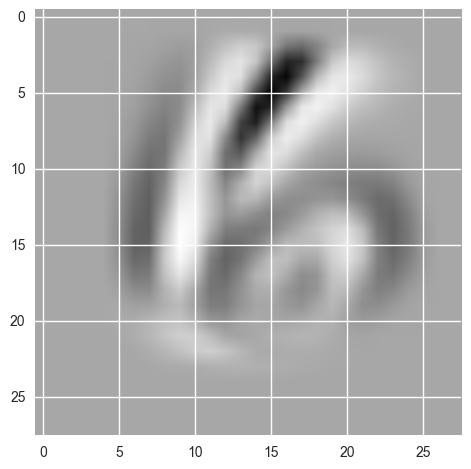

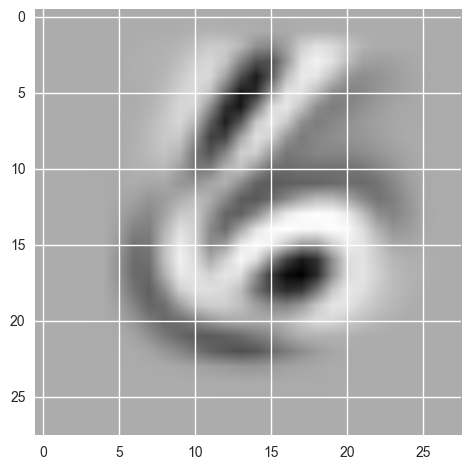

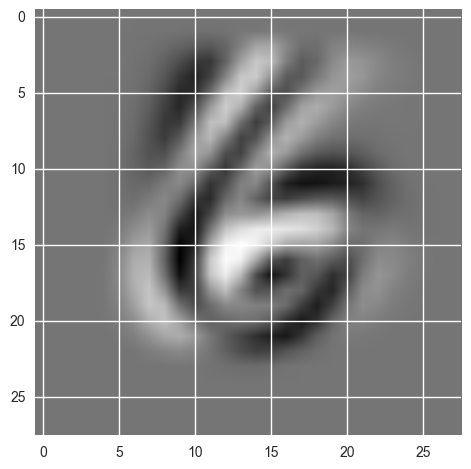

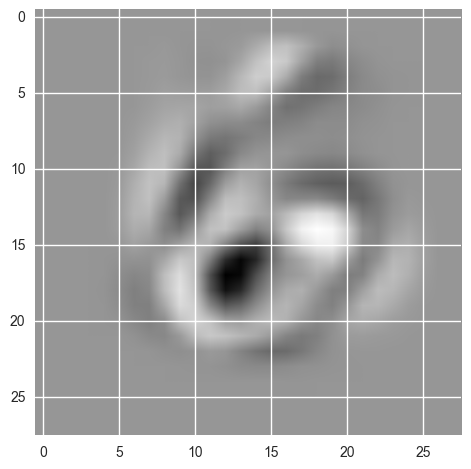

In [40]:
digit = 6
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

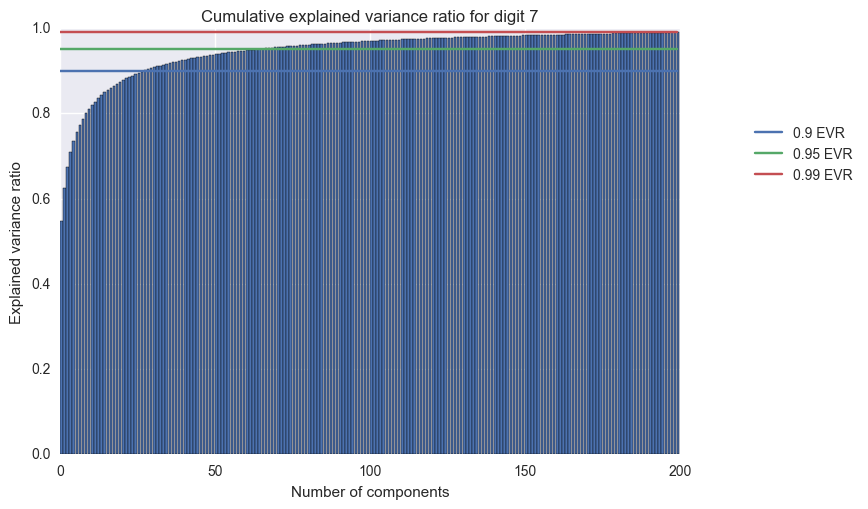

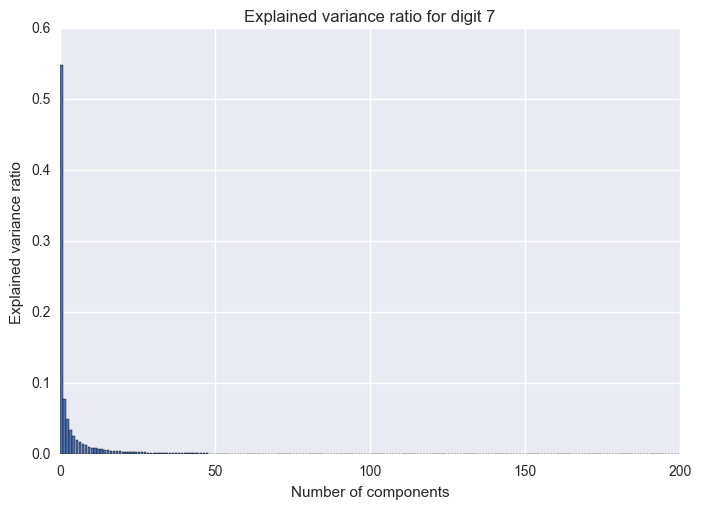

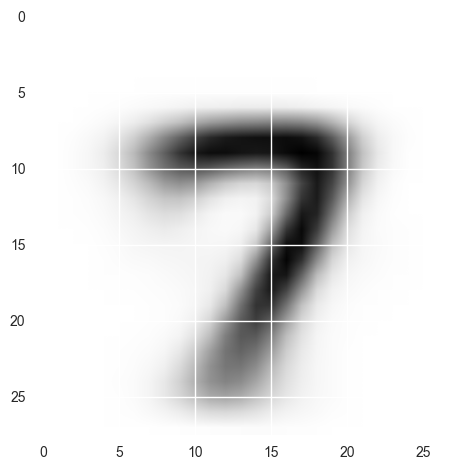

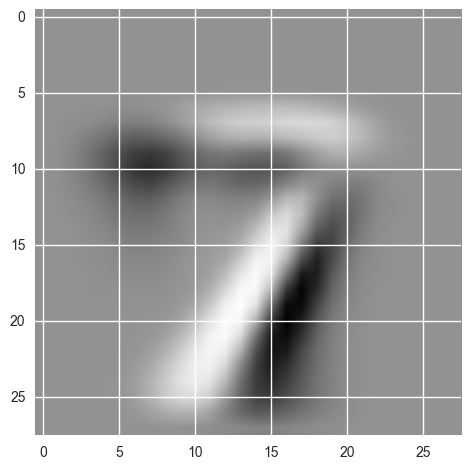

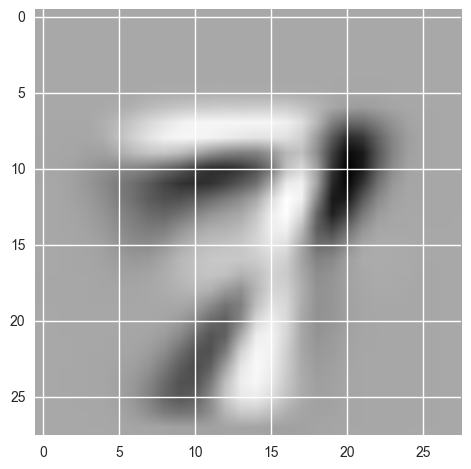

...

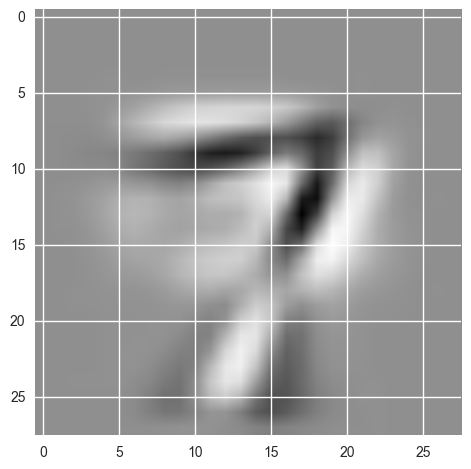

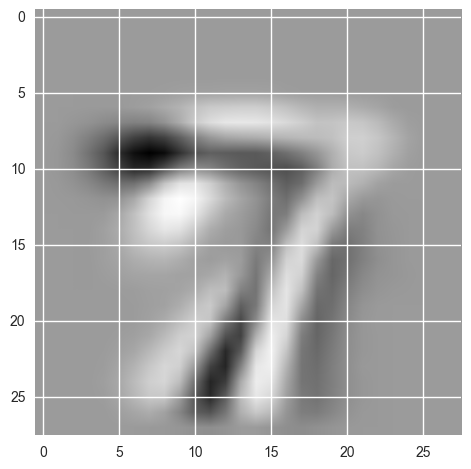

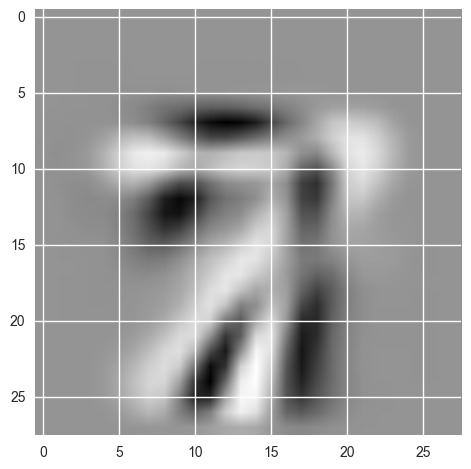

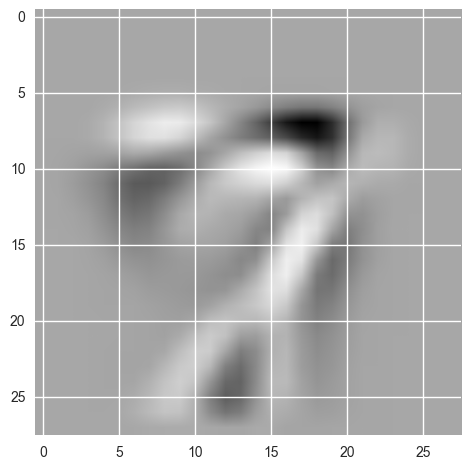

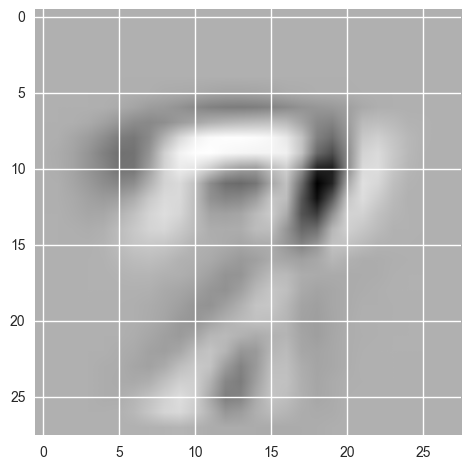

In [41]:
digit = 7
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

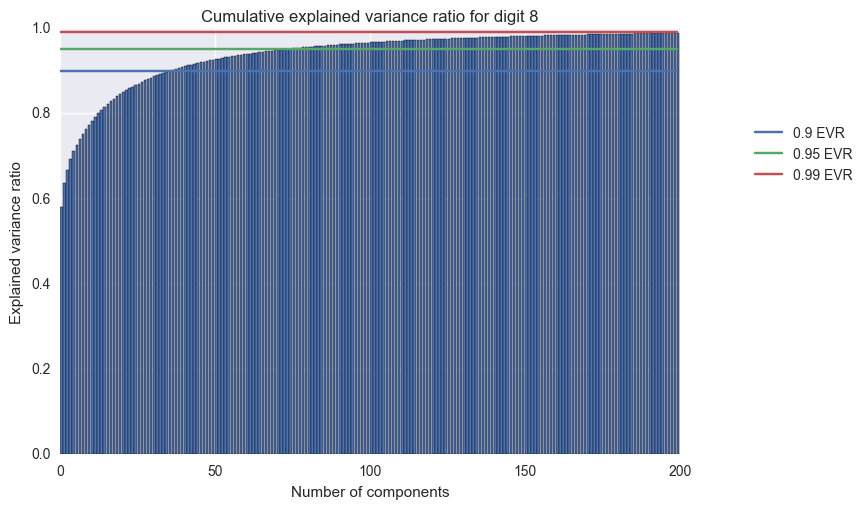

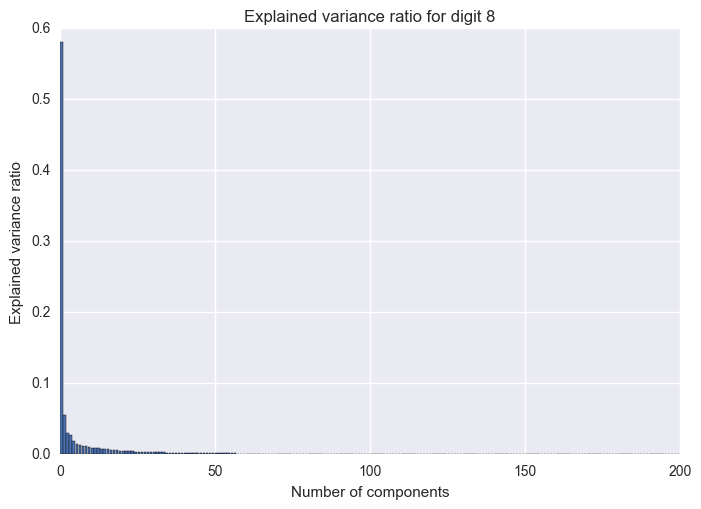

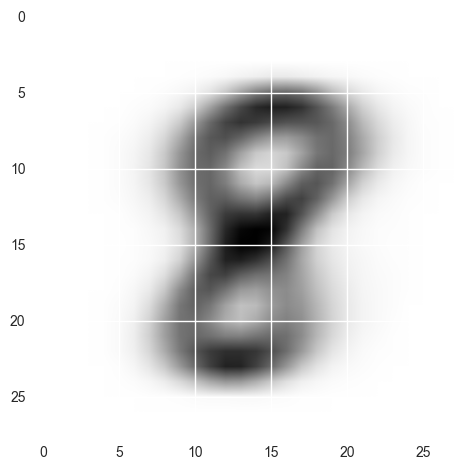

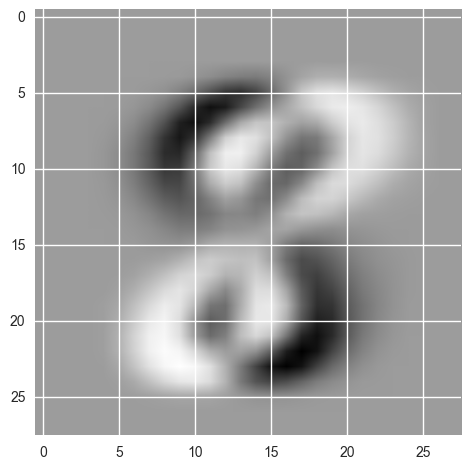

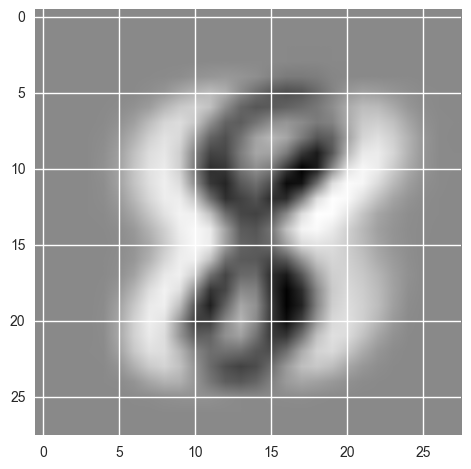

...

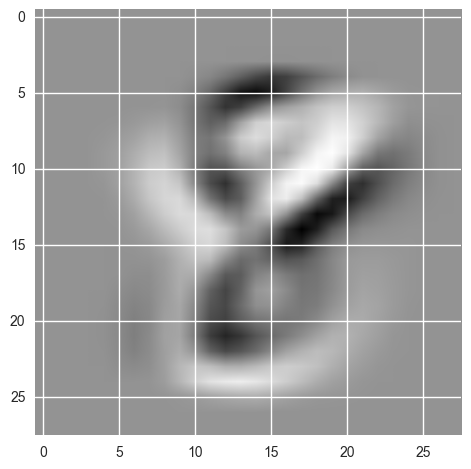

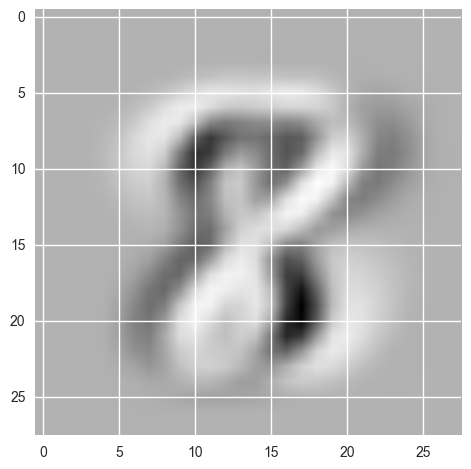

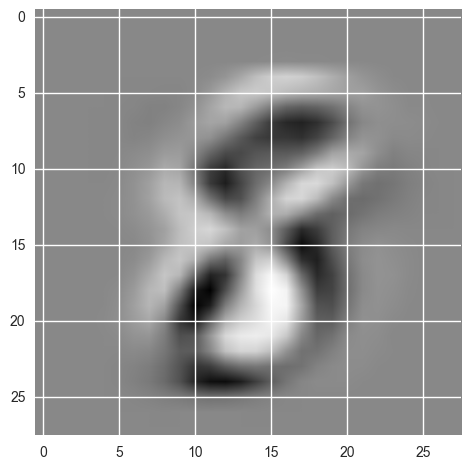

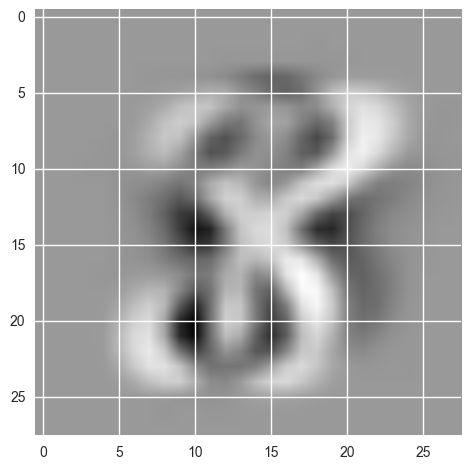

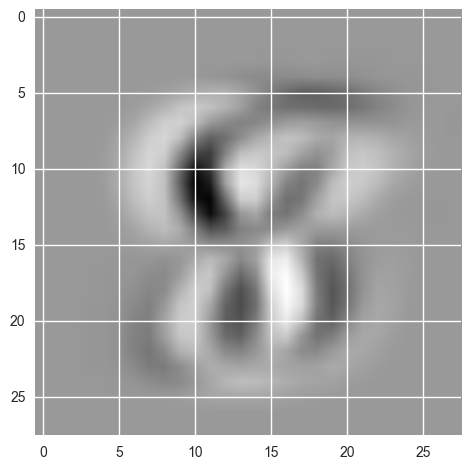

In [42]:
digit = 8
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

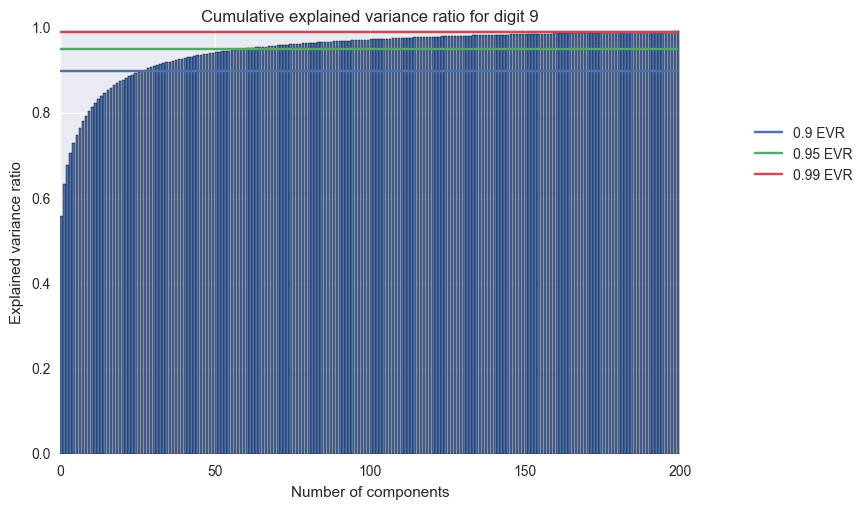

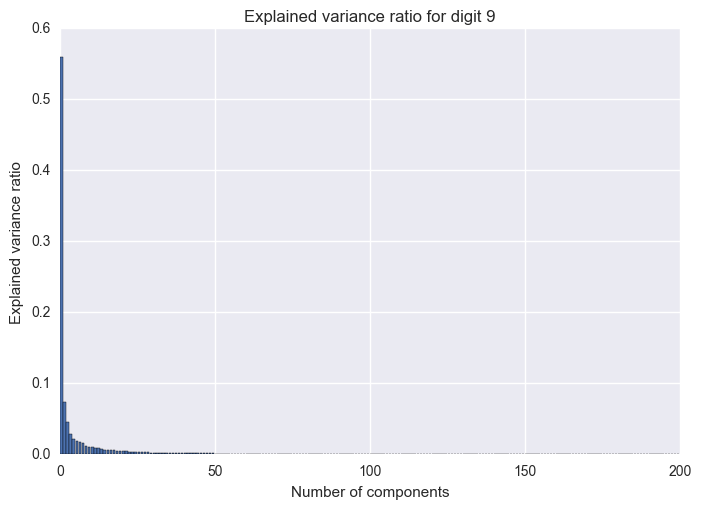

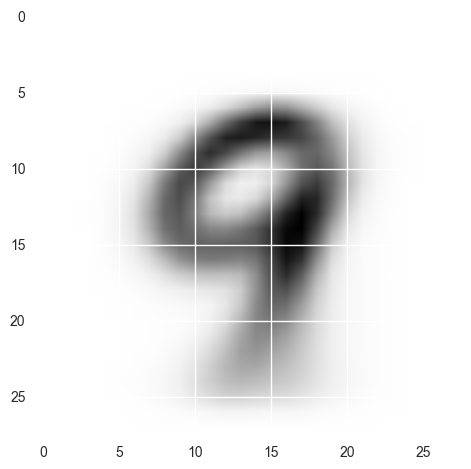

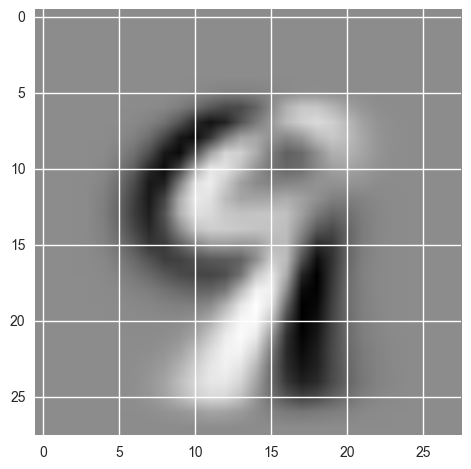

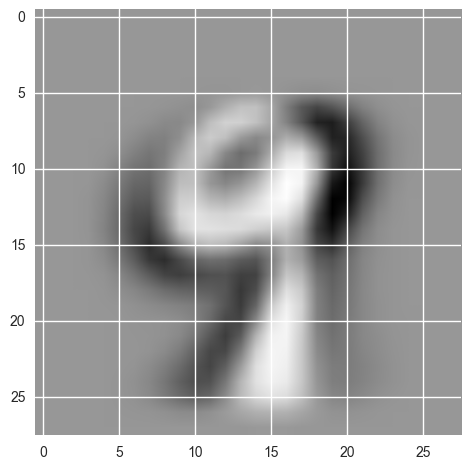

...

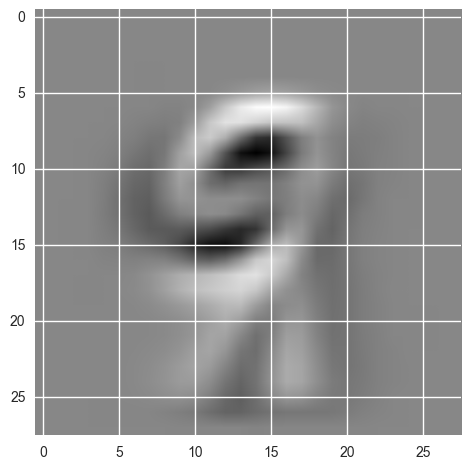

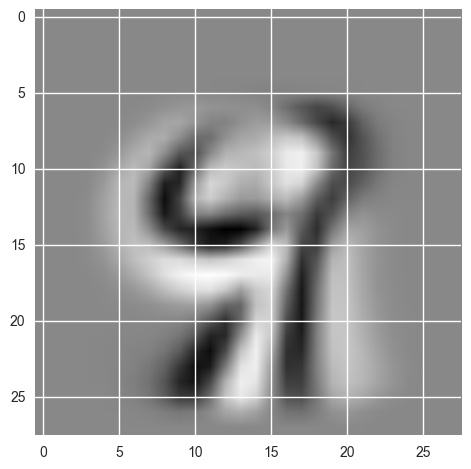

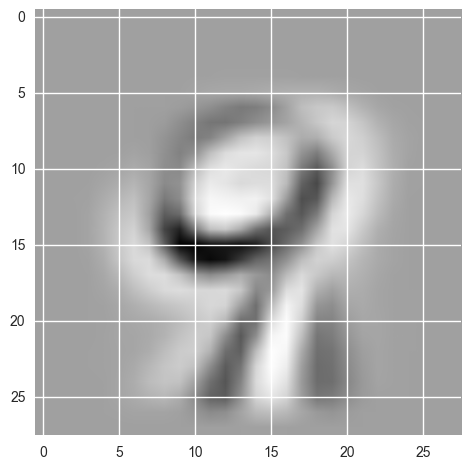

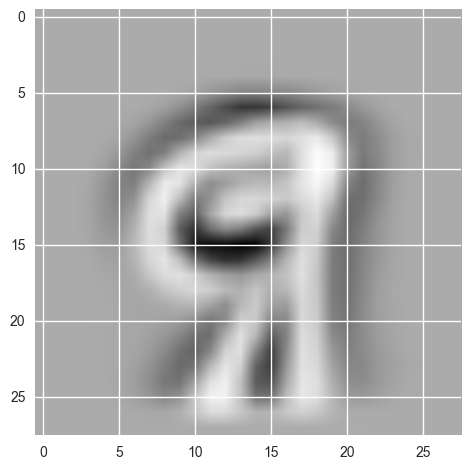

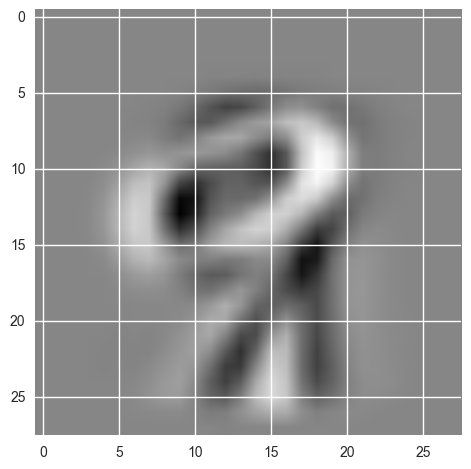

In [43]:
digit = 9
scaler = StandardScaler(with_mean=True, with_std=False)
scaler.fit(df.values[target==digit,:])
df_n = scaler.transform(df.values[target==digit, :])
my_pca = PCA_h(200)
my_pca.fit(df.values[target==digit, :])
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_cum_[:my_pca.get_ncomponents()])
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.9, my_pca.get_ncomponents()), label='0.9 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.95, my_pca.get_ncomponents()), label='0.95 EVR')
plt.plot(range(my_pca.get_ncomponents()), np.repeat(0.99, my_pca.get_ncomponents()), label='0.99 EVR')
plt.legend(loc='best', bbox_to_anchor=(1.1, 0.8))
plt.title("Cumulative explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
plt.clf()
plt.bar(range(my_pca.get_ncomponents()), my_pca.var_explained_[:my_pca.get_ncomponents()])
plt.title("Explained variance ratio for digit {}".format(digit))
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.show()
for component in my_pca.components_[:10]:
    plt.imshow(np.array(list(map(transform_pixel, list(map(lambda x: float(x), component))))).reshape((28, 28)))
    plt.show()

### Часть 3.1

Построим цифры как выпуклые комбинации пары цифр в исходном пространстве, то есть возьмем некоторые пары в виде $$ \alpha * digit_1 + (\alpha - 1) * digit_2 $$, где $$ \alpha \in [0,1] $$

In [46]:
from itertools import product
digits_set1 = np.random.randint(0, df.shape[1], size=10)
digits_set2 = np.random.randint(0, df.shape[1], size=10)

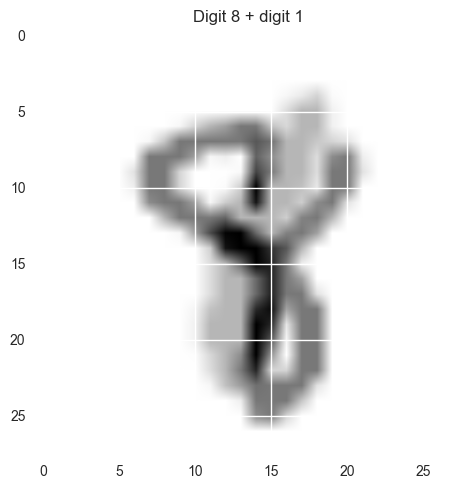

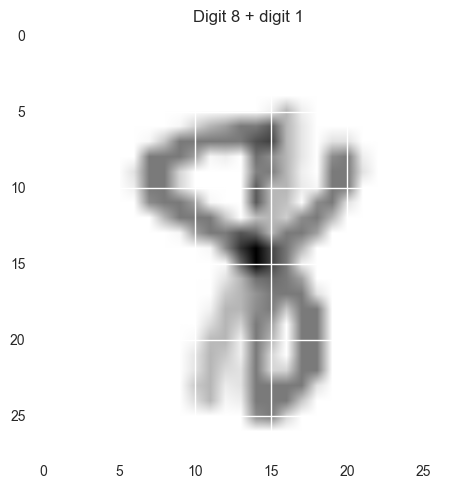

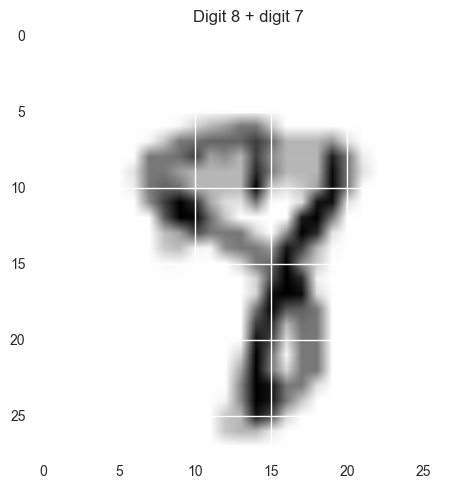

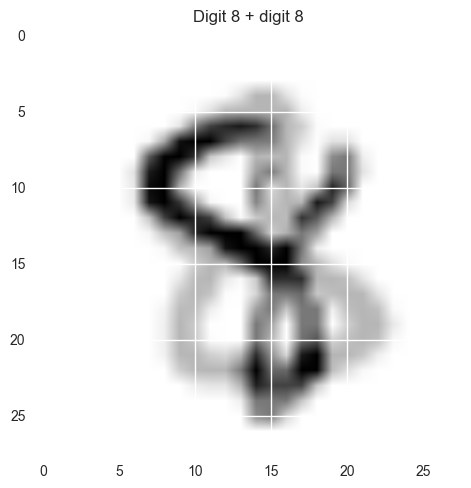

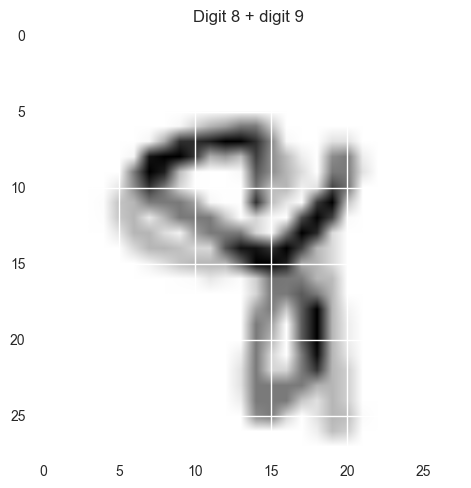

...

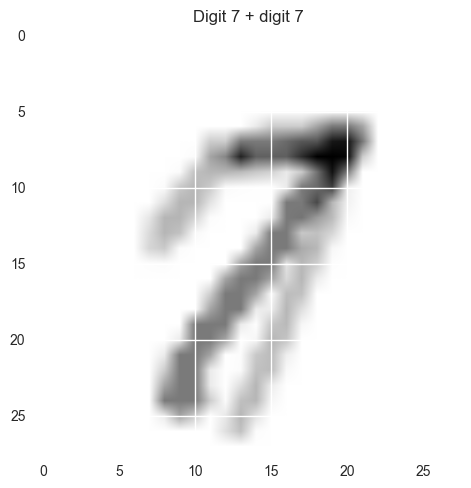

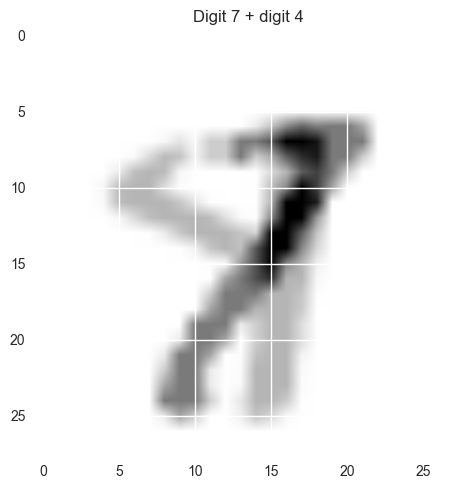

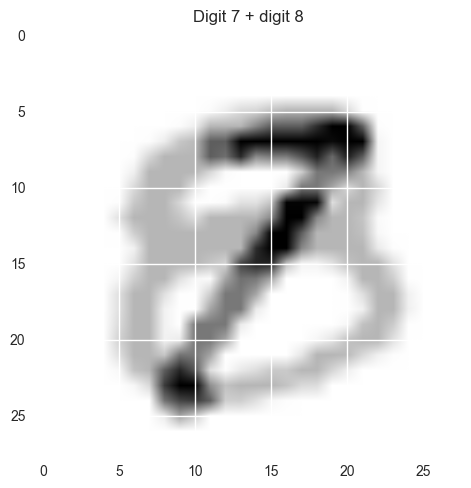

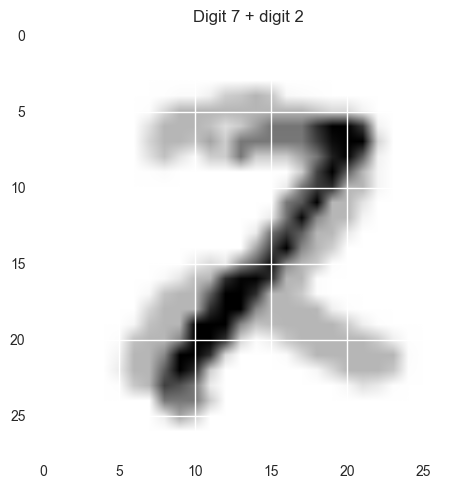

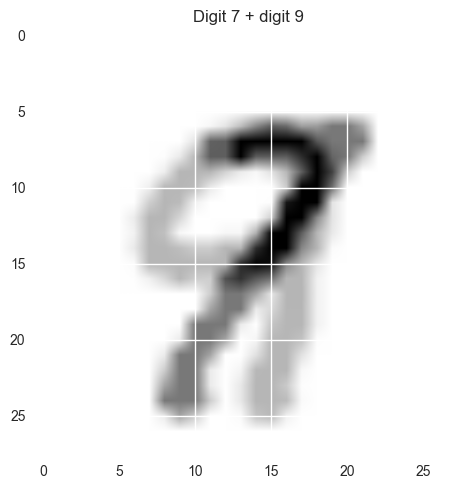

In [50]:
alpha = 0.6
for digit_1, digit_2 in product(digits_set1, digits_set2):
    new_digit = alpha * df.values[digit_1, :] + (1 - alpha) * df.values[digit_2, :]
    plt.imshow(new_digit.reshape((28, 28)))
    plt.title('Digit {} + digit {}'.format(target[digit_1], target[digit_2]))
    plt.show()